In [1]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Cropping2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
from skimage.metrics import structural_similarity as ssim



2025-04-06 12:51:04.083008: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-06 12:51:04.098116: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-06 12:51:04.114835: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-06 12:51:04.119822: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-06 12:51:04.132870: I tensorflow/core/platform/cpu_feature_guar

In [2]:
# Define dataset path
# data_dir = r"/kaggle/input/new-seismic1/New_seismic"
data_dir = "/home/bharath/Arindam_dissertation/New_Semismic_small"

# Get subfolders (each containing clean and noisy .npy files)
subfolders = [os.path.join(data_dir, d) for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d))]

# Function to yield slices from .npy files
def data_generator():
    for folder in subfolders:
        # Identify noisy and clean files
        noisy_file = next(f for f in os.listdir(folder) if "seismic_w_noise_vol" in f)
        clean_file = next(f for f in os.listdir(folder) if "seismicCubes_RFC_fullstack" in f)

        # Load .npy files as float32
        noisy_data = np.load(os.path.join(folder, noisy_file), allow_pickle=True).astype(np.float32)  
        clean_data = np.load(os.path.join(folder, clean_file), allow_pickle=True).astype(np.float32)

        # Normalize data
        noisy_data = (noisy_data - np.min(noisy_data)) / (np.max(noisy_data) - np.min(noisy_data))
        clean_data = (clean_data - np.min(clean_data)) / (np.max(clean_data) - np.min(clean_data))

        # Slice along y-axis (300 slices per volume)
        for i in range(noisy_data.shape[2]):
            yield np.expand_dims(noisy_data[:, :, i], axis=-1), np.expand_dims(clean_data[:, :, i], axis=-1)  

# Create a TensorFlow dataset
dataset = tf.data.Dataset.from_generator(
    data_generator,
    output_signature=(
        tf.TensorSpec(shape=(1259, 300, 1), dtype=tf.float32),  # Noisy input
        tf.TensorSpec(shape=(1259, 300, 1), dtype=tf.float32)   # Clean target
    )
)

# Shuffle and split the dataset
total_slices = 300 * len(subfolders)
train_size = int(0.8 * total_slices)
val_size = int(0.15 * total_slices)

train_dataset = dataset.take(train_size).shuffle(1000).batch(16)
val_dataset = dataset.skip(train_size).take(val_size).batch(16)
test_dataset = dataset.skip(train_size + val_size).batch(16)

# Verify dataset shapes
for noisy, clean in train_dataset.take(1):
    print("Noisy batch shape:", noisy.shape)
    print("Clean batch shape:", clean.shape)




2025-04-06 12:51:06.510393: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 12756 MB memory:  -> device: 0, name: NVIDIA RTX A4000, pci bus id: 0000:17:00.0, compute capability: 8.6
2025-04-06 12:51:16.873867: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 715 of 1000


Noisy batch shape: (16, 1259, 300, 1)
Clean batch shape: (16, 1259, 300, 1)


2025-04-06 12:51:20.187791: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.
2025-04-06 12:51:20.195394: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [3]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Cropping2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Custom MSE + SSIM Loss Function
def combined_mse_ssim_loss(alpha=0.84):
    """Combines MSE and SSIM loss. 
    alpha controls the balance between SSIM and MSE.
    """
    def loss(y_true, y_pred):
        mse = tf.reduce_mean(tf.square(y_true - y_pred))  # MSE
        ssim_loss = 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))  # SSIM loss
        return alpha * ssim_loss + (1 - alpha) * mse  # Weighted sum of losses

    return loss

# Define Autoencoder Model
def build_autoencoder(input_shape=(1259, 300, 1)):  
    input_img = Input(shape=input_shape)

    # Encoder
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(input_img)
    x = MaxPooling2D((2, 2), padding='same')(x)

    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)

    x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)  

    # Decoder
    x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)

    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)

    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)

    # Crop to match original size
    x = Cropping2D(cropping=((5, 0), (4, 0)))(x)

    # Output Layer
    decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)  

    return Model(input_img, decoded)

# Create and compile the autoencoder
autoencoder = build_autoencoder()
autoencoder.compile(optimizer=Adam(learning_rate=0.0001), loss=combined_mse_ssim_loss(alpha=0.84))

# Summary
autoencoder.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 1259, 300, 1)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 1259, 300, 64)  │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 630, 150, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 630, 150, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 315, 75, 128)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 315, 75, 256)   │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 158, 38, 256)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 158, 38, 256)   │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 316, 76, 256)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 316, 76, 128)   │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 632, 152, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 632, 152, 64)   │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 1264, 304, 64)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ cropping2d (Cropping2D)         │ (None, 1259, 300, 64)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 1259, 300, 1)   │           577 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,329,153 (5.07 MB)

 Trainable params: 1,329,153 (5.07 MB)

 Non-trainable params: 0 (0.00 B)

In [4]:
# # Define custom callback to display images and SSIM score
# class DisplayCallback(tf.keras.callbacks.Callback):
#     def on_train_begin(self, logs=None):
#         self.ssim_values = []
#         self.val_losses = []
#         self.train_losses = []

#     def on_epoch_end(self, epoch, logs=None):
#         # Record losses
#         self.val_losses.append(logs['val_loss'])
#         self.train_losses.append(logs['loss'])

#         # Calculate SSIM for validation set
#         ssim_values = []
#         for noisy_batch, clean_batch in val_dataset.take(1):
#             denoised_imgs = self.model.predict(noisy_batch)
#             ssim_values.extend([ssim(clean_batch[i].numpy().squeeze(), denoised_imgs[i].squeeze(), data_range=1.0) for i in range(len(clean_batch))])
#         self.ssim_values.append(np.mean(ssim_values))

#         # Plot original, noisy, and decoded images
#         plt.figure(figsize=(12, 9))  # Updated figsize
#         plt.subplots_adjust(wspace=0.2)  # Reduce space between subplots
#         num_pair=2
#         for i in range(num_pair):
#             plt.subplot(3, numpair, i + 1)
#             plt.title("Original")
#             plt.imshow(clean_batch[i].numpy().squeeze(), cmap='seismic',vmin=0, vmax=1)  # Updated cmap
#             plt.axis('off')

#             plt.subplot(3, numpair, i + 4)
#             plt.title("Noisy")
#             plt.imshow(noisy_batch[i].numpy().squeeze(), cmap='seismic',vmin=0, vmax=1)  # Updated cmap
#             plt.axis('off')

#             plt.subplot(3, numpair, i + 7)
#             plt.title("Denoised")
#             plt.imshow(denoised_imgs[i].squeeze(), cmap='seismic',vmin=0, vmax=1)  # Updated cmap
#             plt.axis('off')

#         # Show SSIM score
#         plt.suptitle(f"Epoch {epoch + 1}: SSIM = {self.ssim_values[-1]:.4f}", fontsize=14)
#         plt.show()

#     def on_train_end(self, logs=None):
#         # Plot SSIM, validation loss, and training loss vs epoch
#         epochs = range(1, len(self.ssim_values) + 1)
#         plt.figure(figsize=(12, 6))
#         plt.plot(epochs, self.ssim_values, 'b-', label='SSIM')
#         # plt.plot(epochs, self.val_losses, 'r-', label='Validation Loss')
#         # plt.plot(epochs, self.train_losses, 'g-', label='Training Loss')
#         plt.xlabel('Epoch')
#         plt.ylabel('Metric')
#         plt.legend()
#         plt.title('SSIM vs Epoch')
#         plt.show()




In [5]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from skimage.metrics import structural_similarity as ssim

class DisplayCallback(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.ssim_values = []
        self.val_losses = []
        self.train_losses = []

    def on_epoch_end(self, epoch, logs=None):
        # Record losses
        self.val_losses.append(logs.get('val_loss', 0))
        self.train_losses.append(logs.get('loss', 0))

        # Calculate SSIM for validation set
        ssim_values = []
        for noisy_batch, clean_batch in val_dataset.take(1):
            denoised_imgs = self.model.predict(noisy_batch, verbose=0)
            for i in range(len(clean_batch)):
                ssim_values.append(
                    ssim(
                        clean_batch[i].numpy().squeeze(),
                        denoised_imgs[i].squeeze(),
                        data_range=1.0
                    )
                )
        self.ssim_values.append(np.mean(ssim_values))

        num_pair = 2  # Number of image pairs

        # **Ensure the following plotting is inside the method**
        fig = plt.figure(figsize=(8,10 ))
        gs = gridspec.GridSpec(3, num_pair, figure=fig, wspace=0.2)  # Define grid layout

        for i in range(num_pair):
            # Original image
            ax1 = plt.subplot(gs[0, i])
            ax1.set_title("Original")
            im1 = ax1.imshow(clean_batch[i].numpy().squeeze(), cmap='gray', vmin=0, vmax=1)
            ax1.axis('off')
            fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)  # Add colorbar

            # Noisy image
            ax2 = plt.subplot(gs[1, i])
            ax2.set_title("Noisy")
            im2 = ax2.imshow(noisy_batch[i].numpy().squeeze(), cmap='gray', vmin=0, vmax=1)
            ax2.axis('off')
            fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)  # Add colorbar

            # Denoised image
            ax3 = plt.subplot(gs[2, i])
            ax3.set_title("Denoised")
            im3 = ax3.imshow(denoised_imgs[i].squeeze(), cmap='gray', vmin=0, vmax=1)
            ax3.axis('off')
            fig.colorbar(im3, ax=ax3, fraction=0.046, pad=0.04)  # Add colorbar

        plt.suptitle(f"Epoch {epoch + 1}: SSIM = {self.ssim_values[-1]:.4f}", fontsize=14)
        plt.tight_layout()
        plt.show()

    def on_train_end(self, logs=None):
        # Plot SSIM vs. Epoch
        epochs = range(1, len(self.ssim_values) + 1)
        plt.figure(figsize=(12, 6))
        plt.plot(epochs, self.ssim_values, 'b-', label='SSIM')
        plt.xlabel('Epoch')
        plt.ylabel('SSIM Score')
        plt.title('SSIM vs Epoch')
        plt.legend()
        plt.grid(True)
        plt.show()


In [6]:
# # Function to visualize a few pairs of noisy and clean training data
# def visualize_training_data(train_dataset, num_pairs=3):
#     for noisy_batch, clean_batch in train_dataset.take(1):
#         plt.figure(figsize=(24, 8))  # Updated figsize
#         plt.subplots_adjust(wspace=0.2)  # Reduce space between subplots
#         for i in range(num_pairs):
#             # Noisy image
#             plt.subplot(2, num_pairs, i + 1)
#             plt.title("Noisy")
#             plt.imshow(noisy_batch[i].numpy().squeeze(), cmap='seismic')  # Updated cmap
#             plt.axis('off')

#             # Clean image
#             plt.subplot(2, num_pairs, num_pairs + i + 1)
#             plt.title("Clean")
#             plt.imshow(clean_batch[i].numpy().squeeze(), cmap='seismic')  # Updated cmap
#             plt.axis('off')

#         plt.show()


# # Run the visualization
# visualize_training_data(train_dataset, num_pairs=3)

# # Train the model with the callback
# history = autoencoder.fit(
#     train_dataset,
#     epochs=20,  # Adjust as needed
#     validation_data=val_dataset,
#     callbacks=[DisplayCallback()]  # Use the custom callback
# )

# # Plot training loss, validation loss, and SSIM over epochs
# epochs = range(1, len(history.history['loss']) + 1)
# plt.figure(figsize=(12, 6))
# plt.plot(epochs, history.history['loss'], 'g-', label='Training Loss')
# plt.plot(epochs, history.history['val_loss'], 'r-', label='Validation Loss')
# plt.xlabel('Epoch')
# plt.ylabel('Loss')
# plt.legend()
# plt.title('Training and Validation Loss vs Epoch')
# plt.show()

2025-04-06 12:51:30.597311: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 854 of 1000
2025-04-06 12:51:32.604832: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


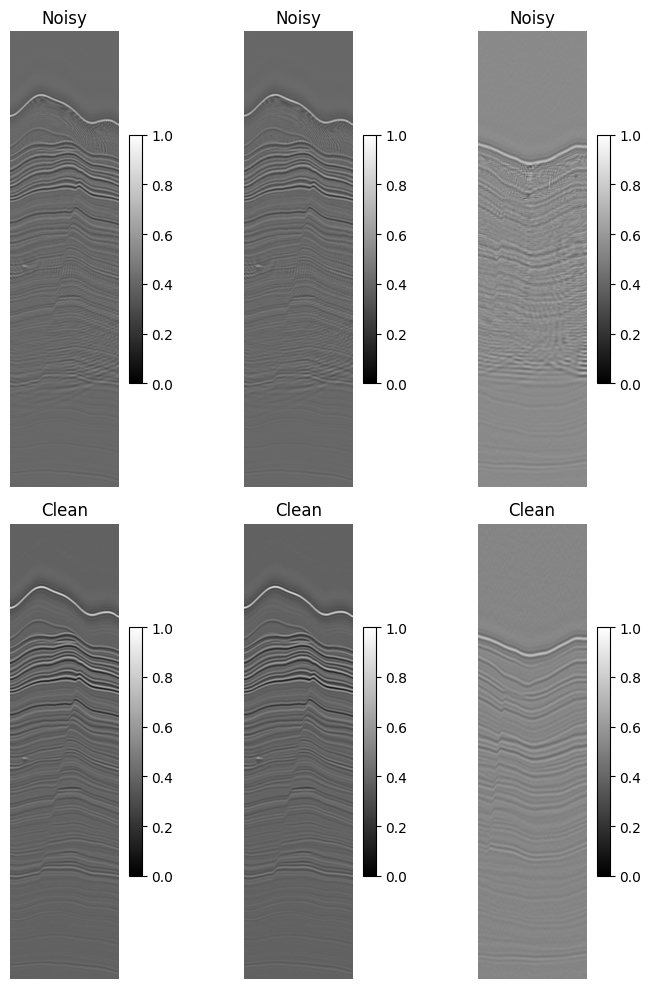

Epoch 1/75


2025-04-06 12:51:33.268772: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-04-06 12:51:45.230686: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 880 of 1000
2025-04-06 12:51:47.024777: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.
I0000 00:00:1743924107.039065 3013273 service.cc:146] XLA service 0x71e5d400e880 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1743924107.039099 3013273 service.cc:154]   StreamExecutor device (0): NVIDIA RTX A4000, Compute Capability 8.6
2025-04-06 12:51:47.105655: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
W0000 00:00:1743924107.198352 3013273 assert_op.cc:38] Ignoring Assert operator compile_los

     60/Unknown 105s 401ms/step - loss: 0.1803

2025-04-06 12:53:17.947786: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_2]]
2025-04-06 12:53:17.947916: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 12:53:17.947953: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
/home/bharath/miniconda3/envs/tf/lib/python3.12/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(value)
W0000 00:00:1743924210.119992 3013270 assert_op.cc:38] Ignoring Assert operator compile_loss/loss/SSIM/Assert/Assert
W0000 00:00:1743924210.120794 3013270 assert_op.

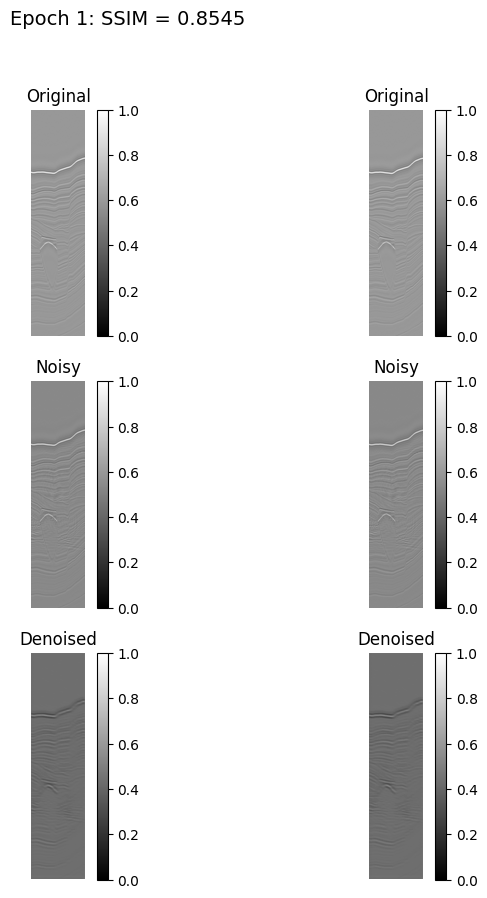

60/60 ━━━━━━━━━━━━━━━━━━━━ 142s 1s/step - loss: 0.1801 - val_loss: 0.1114
Epoch 2/75


2025-04-06 12:54:05.572400: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 883 of 1000
2025-04-06 12:54:07.356642: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step - loss: 0.1214

2025-04-06 12:54:31.933680: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2025-04-06 12:54:31.933757: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 12:54:31.933793: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 12:54:45.184911: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 12:54:45.184962: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


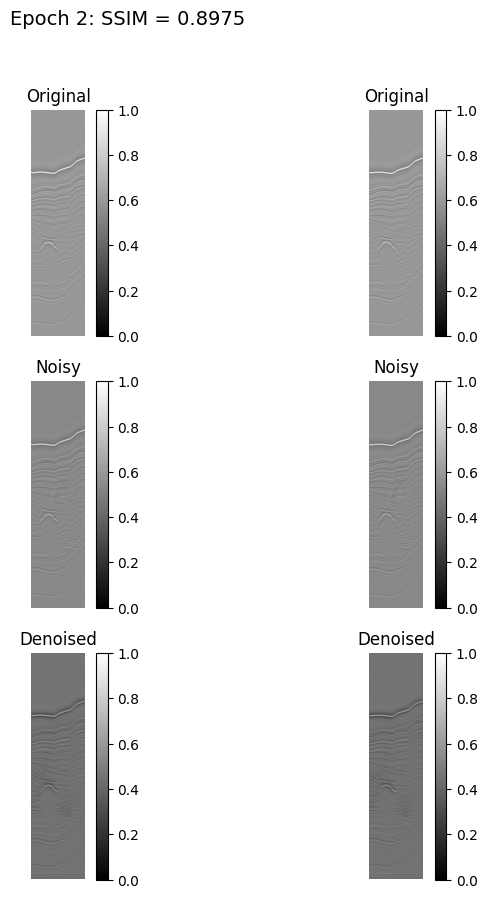

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 849ms/step - loss: 0.1212 - val_loss: 0.0839
Epoch 3/75


2025-04-06 12:55:07.873803: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 889 of 1000
2025-04-06 12:55:09.605575: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step - loss: 0.0841

2025-04-06 12:55:33.858940: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 12:55:47.057016: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_2]]
2025-04-06 12:55:47.057101: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 12:55:47.057133: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


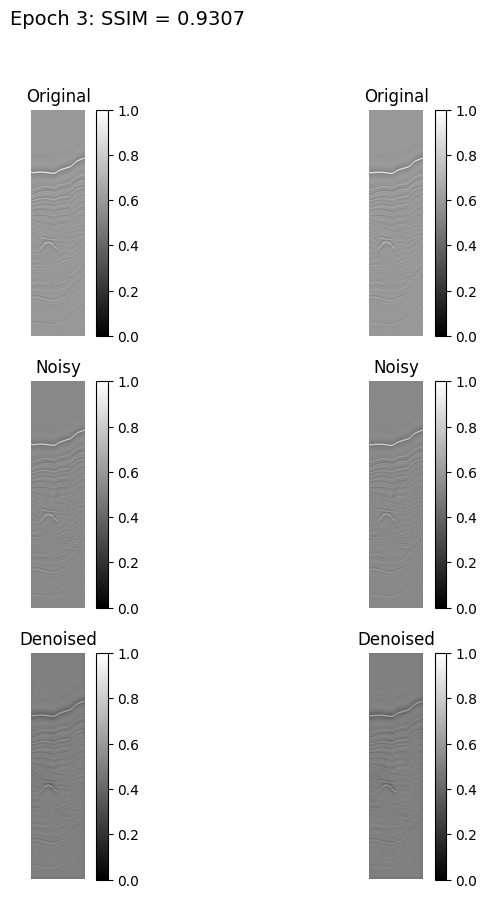

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 846ms/step - loss: 0.0840 - val_loss: 0.0541
Epoch 4/75


2025-04-06 12:56:09.954677: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 882 of 1000
2025-04-06 12:56:11.749972: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step - loss: 0.0662

2025-04-06 12:56:35.877272: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 12:56:49.088043: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 12:56:49.088110: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


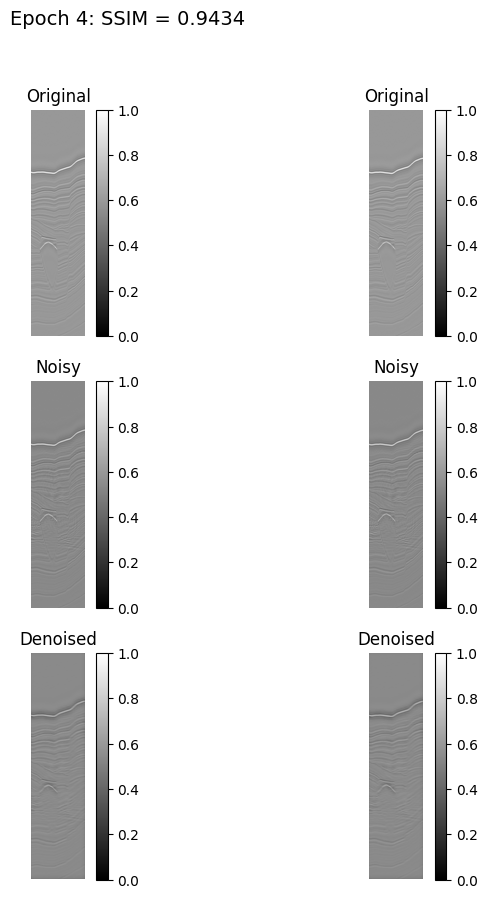

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 842ms/step - loss: 0.0662 - val_loss: 0.0415
Epoch 5/75


2025-04-06 12:57:11.817294: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 885 of 1000
2025-04-06 12:57:13.563694: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step - loss: 0.0561

2025-04-06 12:57:37.615351: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 12:57:37.615426: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 12:57:50.744079: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 12:57:50.744164: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


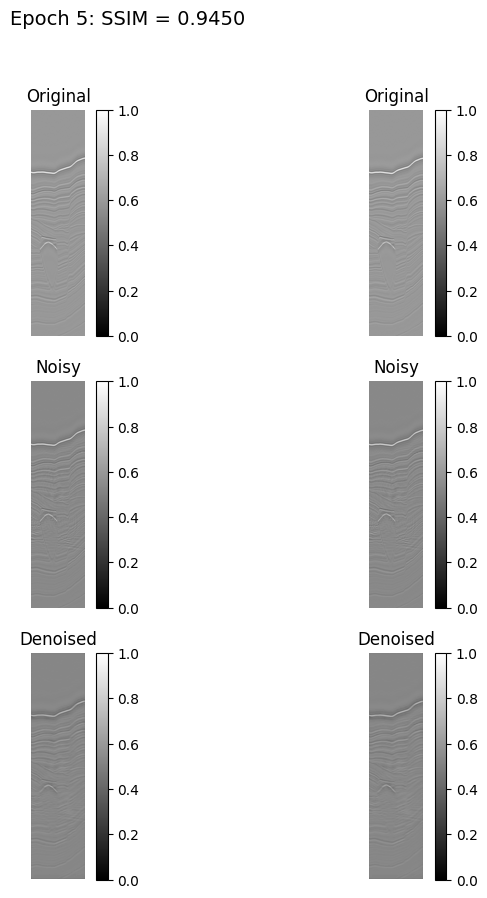

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 843ms/step - loss: 0.0561 - val_loss: 0.0400
Epoch 6/75


2025-04-06 12:58:13.693502: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 877 of 1000
2025-04-06 12:58:15.528350: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step - loss: 0.0503

2025-04-06 12:58:39.527925: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 12:58:39.527996: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 12:58:52.604990: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 12:58:52.605060: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 12:59:04.802156: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


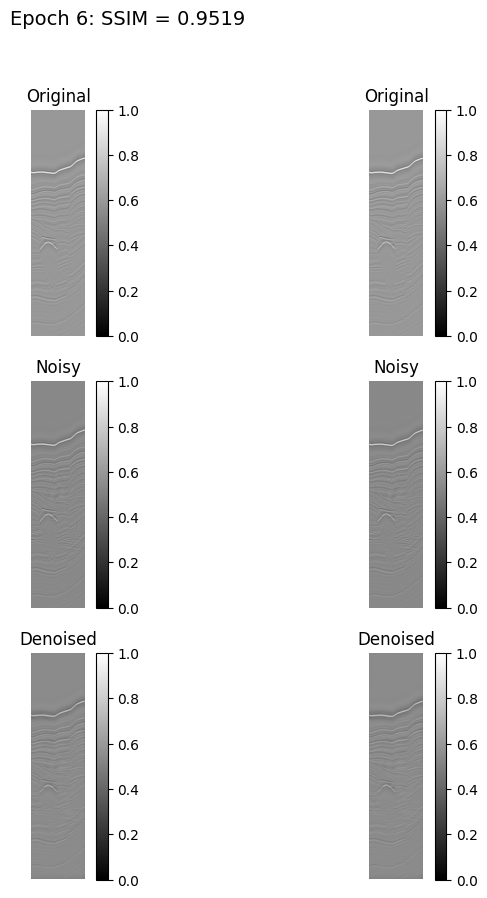

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 837ms/step - loss: 0.0503 - val_loss: 0.0340
Epoch 7/75


2025-04-06 12:59:15.317660: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 868 of 1000
2025-04-06 12:59:17.197256: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step - loss: 0.0453

2025-04-06 12:59:54.170376: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 12:59:54.170453: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


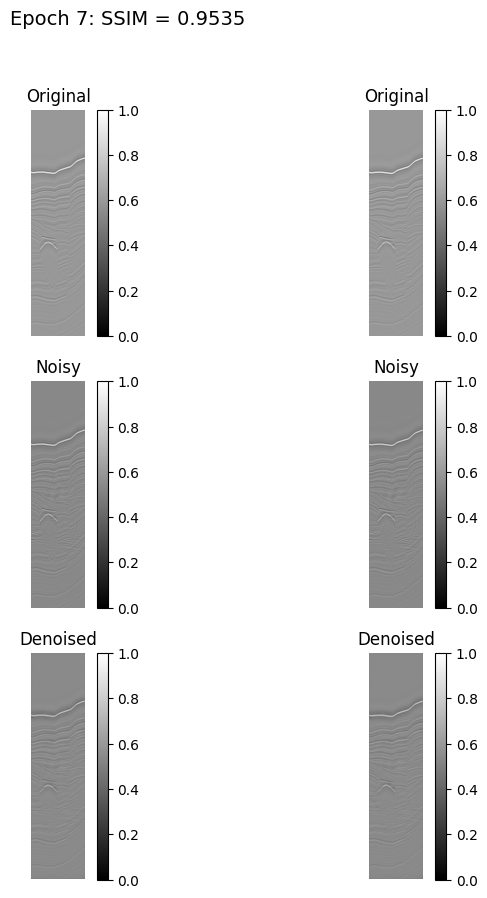

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 835ms/step - loss: 0.0452 - val_loss: 0.0332
Epoch 8/75


2025-04-06 13:00:16.864466: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 882 of 1000
2025-04-06 13:00:18.632994: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step - loss: 0.0427

2025-04-06 13:00:42.641833: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:00:42.641909: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:00:55.808902: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:00:55.808976: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


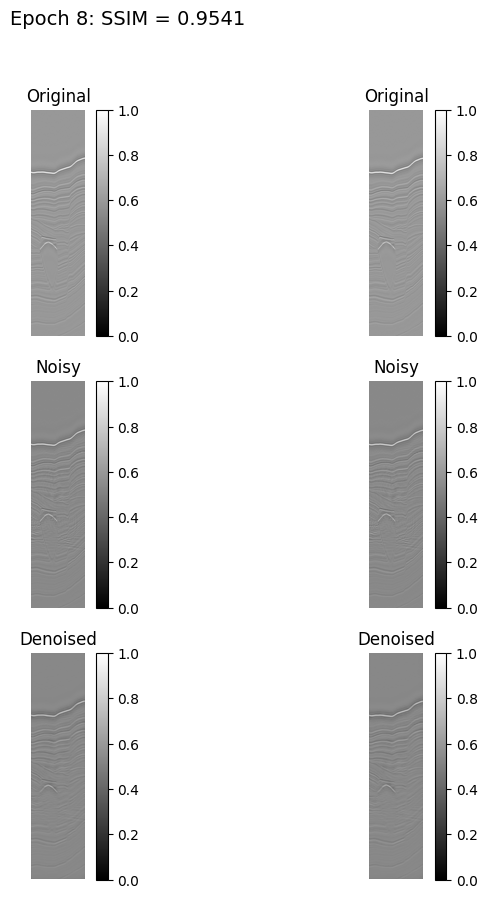

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 839ms/step - loss: 0.0427 - val_loss: 0.0336
Epoch 9/75


2025-04-06 13:01:18.539641: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 874 of 1000
2025-04-06 13:01:20.416647: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - loss: 0.0405

2025-04-06 13:01:58.829973: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:01:58.830059: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


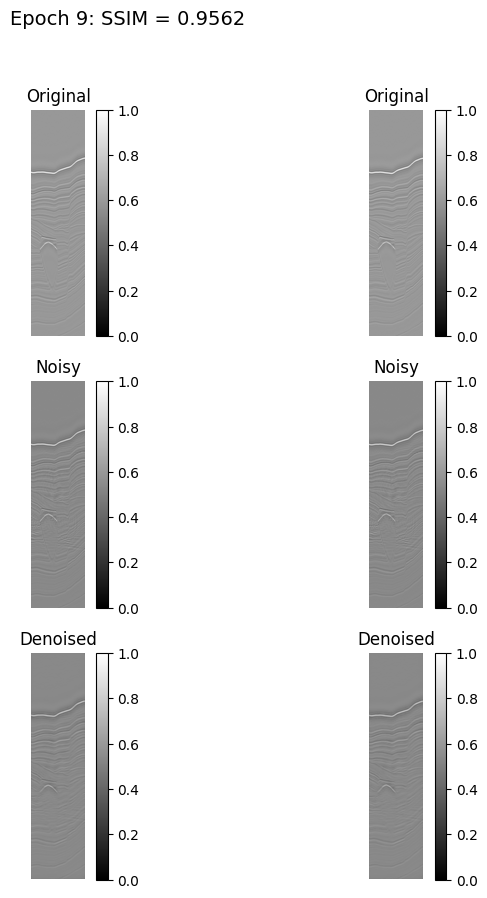

60/60 ━━━━━━━━━━━━━━━━━━━━ 63s 864ms/step - loss: 0.0405 - val_loss: 0.0321
Epoch 10/75


2025-04-06 13:02:21.848980: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 889 of 1000
2025-04-06 13:02:23.573346: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - loss: 0.0394

2025-04-06 13:03:00.835218: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:03:00.835289: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


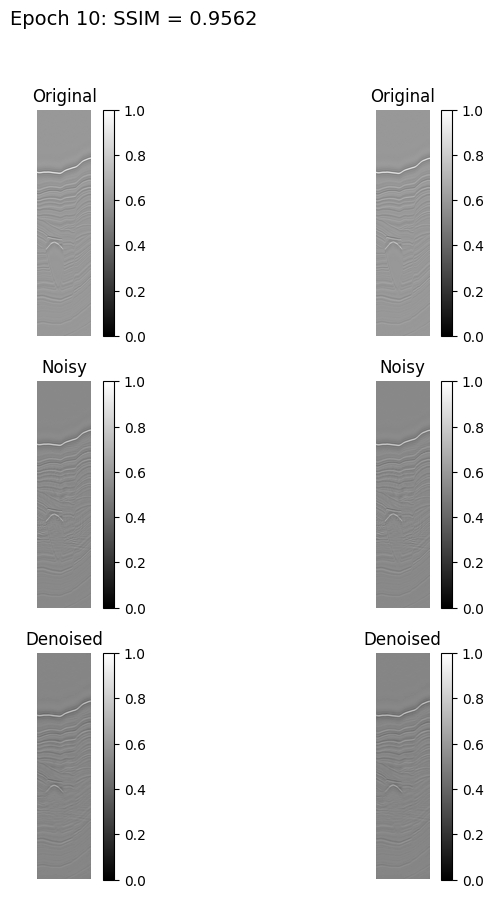

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 842ms/step - loss: 0.0394 - val_loss: 0.0330
Epoch 11/75


2025-04-06 13:03:23.658260: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 869 of 1000
2025-04-06 13:03:25.523427: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - loss: 0.0376

2025-04-06 13:03:49.702918: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:03:49.702994: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:04:02.952280: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:04:02.952361: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


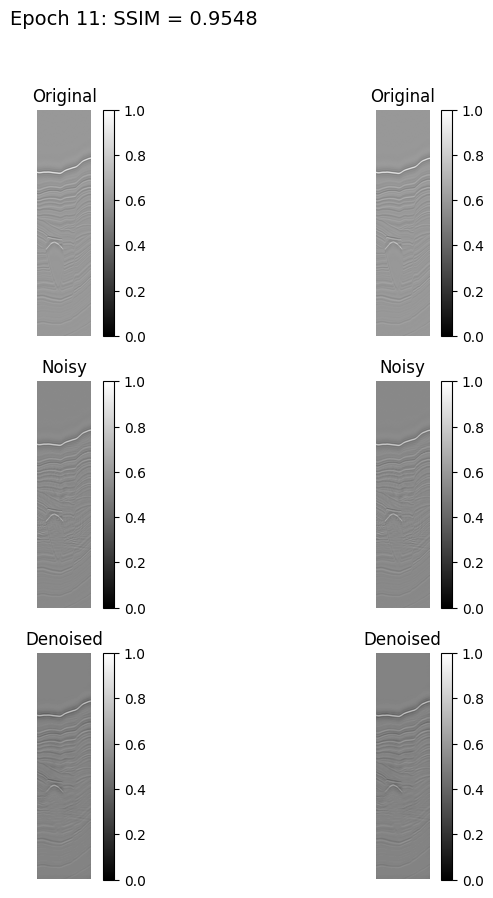

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 844ms/step - loss: 0.0376 - val_loss: 0.0354
Epoch 12/75


2025-04-06 13:04:25.708266: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 883 of 1000
2025-04-06 13:04:27.502462: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step - loss: 0.0373

2025-04-06 13:04:51.597406: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:04:51.597478: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:05:04.734375: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:05:04.734447: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


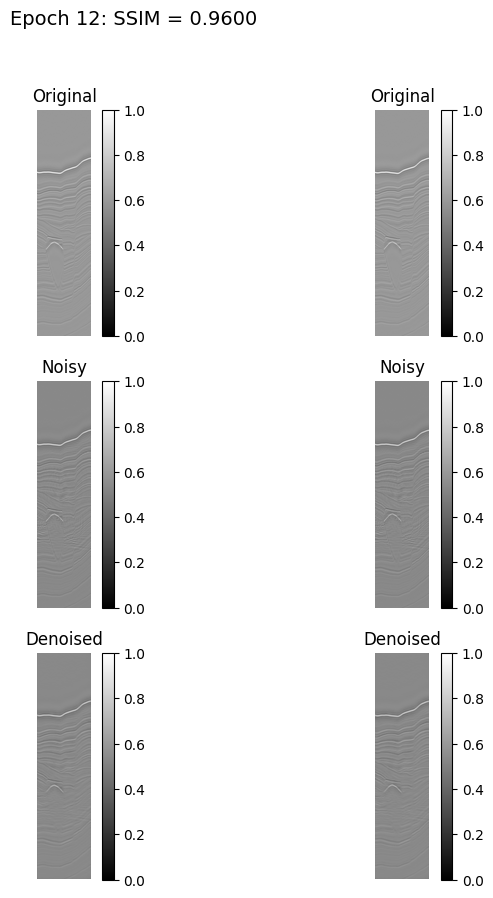

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 838ms/step - loss: 0.0373 - val_loss: 0.0294
Epoch 13/75


2025-04-06 13:05:27.387340: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 891 of 1000
2025-04-06 13:05:29.109083: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step - loss: 0.0355

2025-04-06 13:05:53.122059: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_2]]
2025-04-06 13:05:53.122119: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:05:53.122154: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:06:06.289580: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:06:06.289650: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


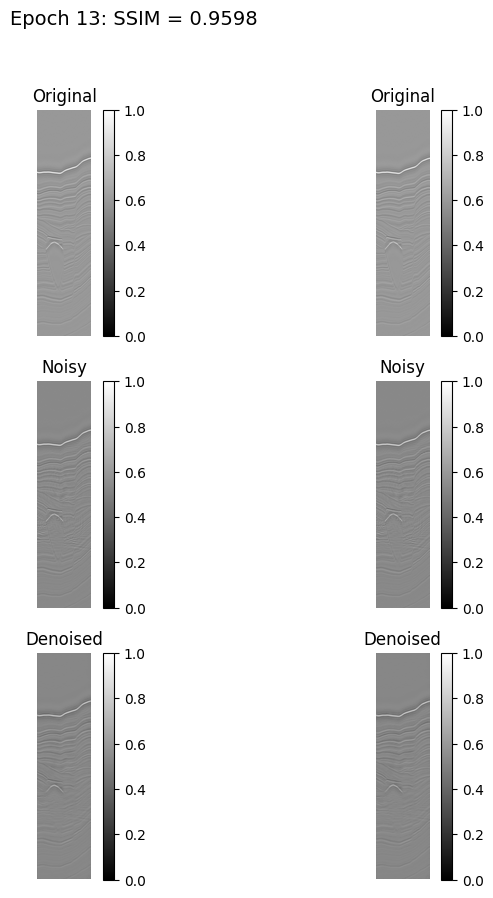

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 843ms/step - loss: 0.0355 - val_loss: 0.0306
Epoch 14/75


2025-04-06 13:06:29.278680: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 875 of 1000
2025-04-06 13:06:31.160450: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step - loss: 0.0349

2025-04-06 13:06:55.117197: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:06:55.117273: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:07:08.257605: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:07:08.257643: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


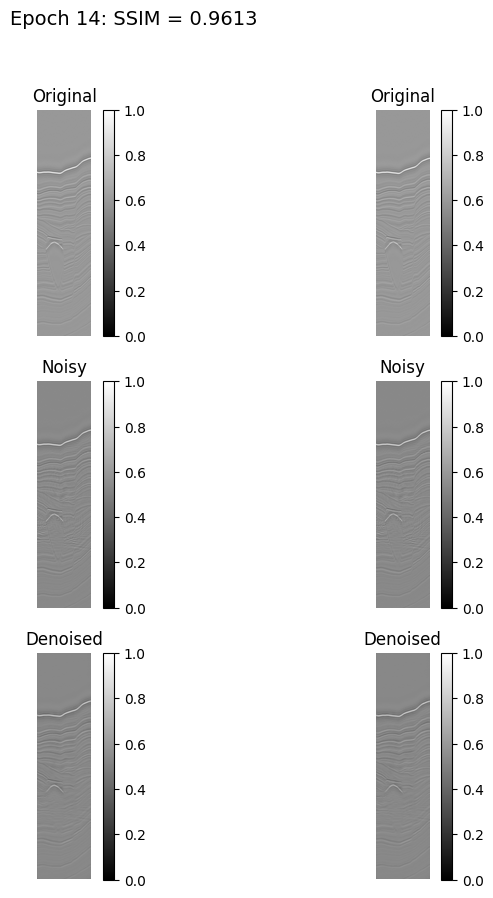

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 840ms/step - loss: 0.0349 - val_loss: 0.0294
Epoch 15/75


2025-04-06 13:07:31.129338: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 888 of 1000
2025-04-06 13:07:32.884559: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step - loss: 0.0339

2025-04-06 13:08:10.025986: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662


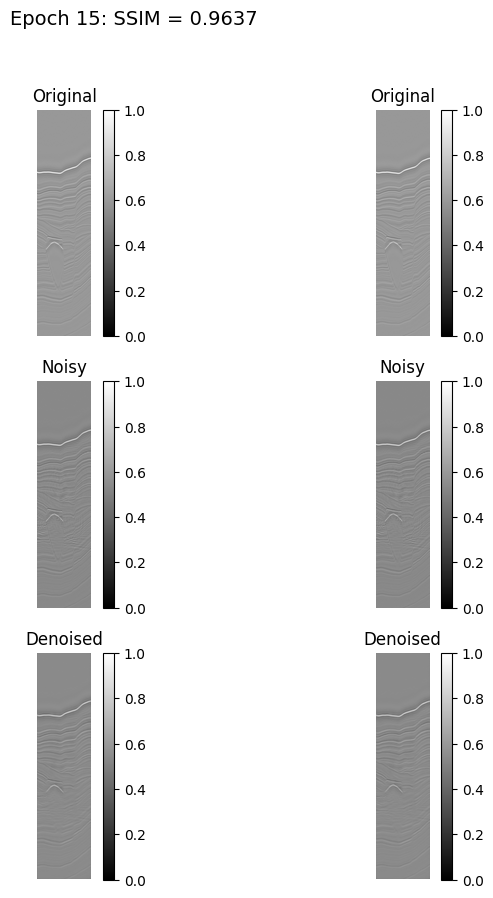

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 840ms/step - loss: 0.0339 - val_loss: 0.0272
Epoch 16/75


2025-04-06 13:08:32.877933: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 873 of 1000
2025-04-06 13:08:34.722770: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - loss: 0.0334

2025-04-06 13:08:59.938233: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:09:13.046587: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:09:13.046662: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


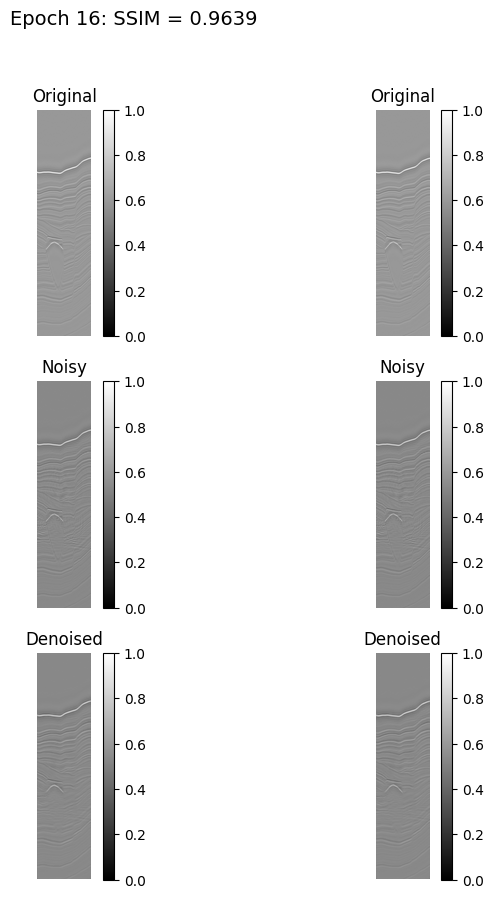

60/60 ━━━━━━━━━━━━━━━━━━━━ 63s 858ms/step - loss: 0.0334 - val_loss: 0.0274
Epoch 17/75


2025-04-06 13:09:35.762543: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 897 of 1000
2025-04-06 13:09:37.449262: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - loss: 0.0324

2025-04-06 13:10:01.606945: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:10:14.661996: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:10:14.662070: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


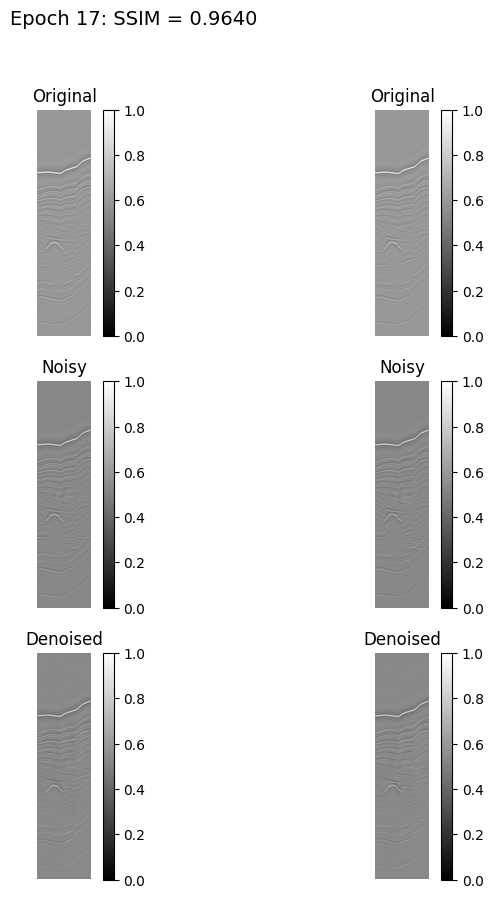

60/60 ━━━━━━━━━━━━━━━━━━━━ 61s 837ms/step - loss: 0.0324 - val_loss: 0.0277
Epoch 18/75


2025-04-06 13:10:37.222806: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 882 of 1000
2025-04-06 13:10:38.988363: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step - loss: 0.0324

2025-04-06 13:11:03.198838: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:11:16.360058: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:11:16.360128: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


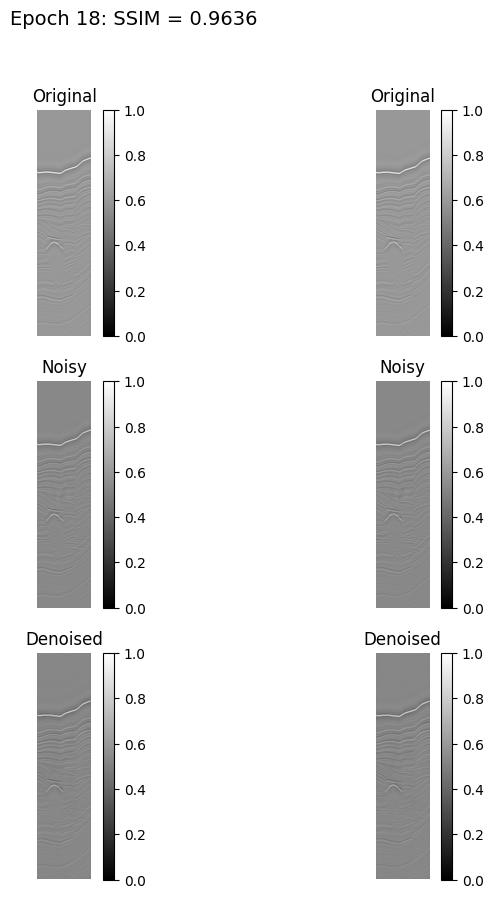

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 844ms/step - loss: 0.0324 - val_loss: 0.0285
Epoch 19/75


2025-04-06 13:11:39.186118: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 888 of 1000
2025-04-06 13:11:40.908065: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step - loss: 0.0311

2025-04-06 13:12:18.332802: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:12:18.332887: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


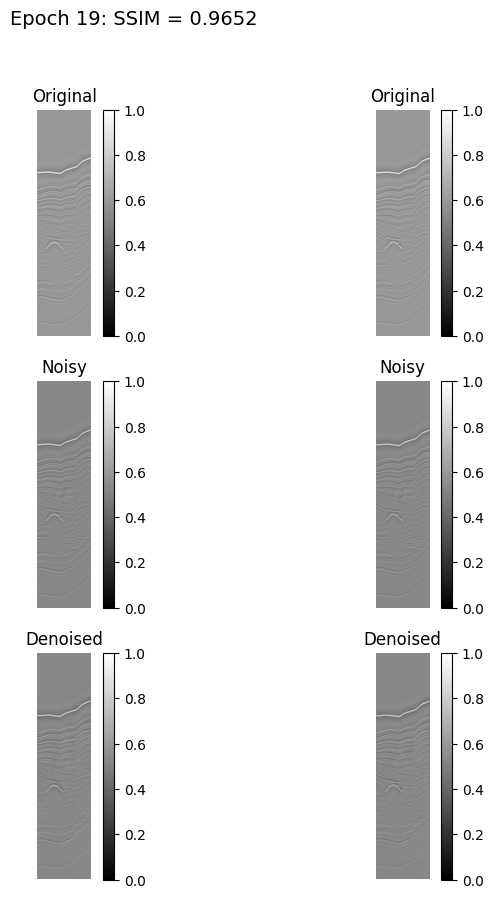

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 843ms/step - loss: 0.0311 - val_loss: 0.0272
Epoch 20/75


2025-04-06 13:12:41.078021: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 880 of 1000
2025-04-06 13:12:42.871290: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step - loss: 0.0312

2025-04-06 13:13:06.914064: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:13:06.914131: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:13:20.174137: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:13:20.174209: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


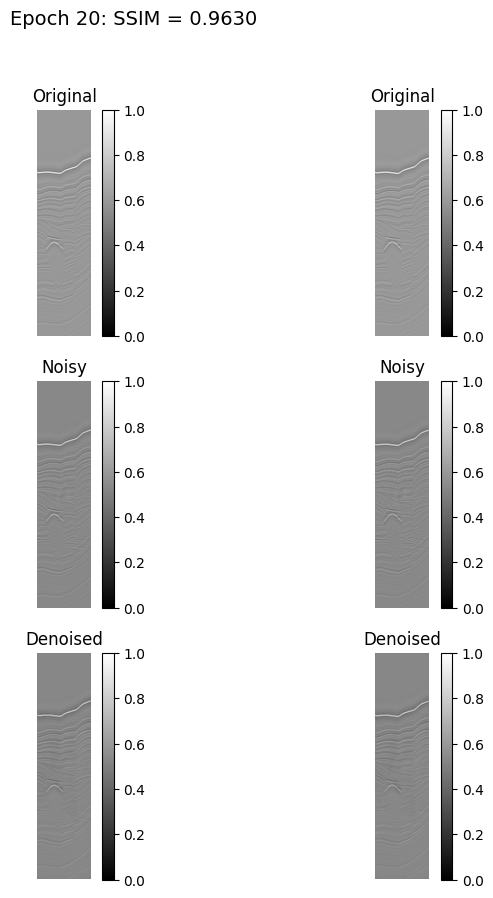

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 840ms/step - loss: 0.0312 - val_loss: 0.0292
Epoch 21/75


2025-04-06 13:13:42.831957: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 895 of 1000
2025-04-06 13:13:44.534912: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step - loss: 0.0317

2025-04-06 13:14:21.617239: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:14:21.617312: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


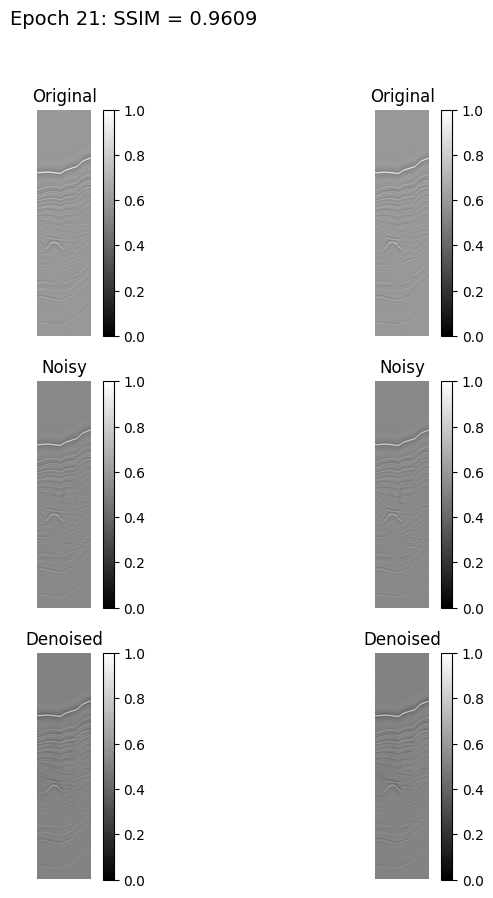

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 841ms/step - loss: 0.0317 - val_loss: 0.0317
Epoch 22/75


2025-04-06 13:14:45.697299: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 901 of 1000
2025-04-06 13:14:46.132143: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step - loss: 0.0314

2025-04-06 13:15:10.217279: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:15:23.236125: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:15:23.236198: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


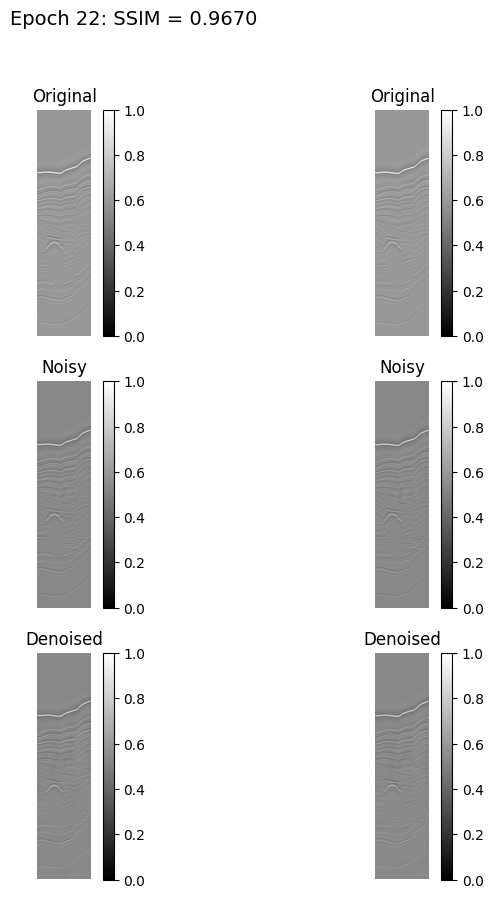

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 840ms/step - loss: 0.0314 - val_loss: 0.0258
Epoch 23/75


2025-04-06 13:15:46.133072: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 885 of 1000
2025-04-06 13:15:47.917003: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step - loss: 0.0304

2025-04-06 13:16:12.500807: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:16:12.500905: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:16:25.627527: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:16:25.627594: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


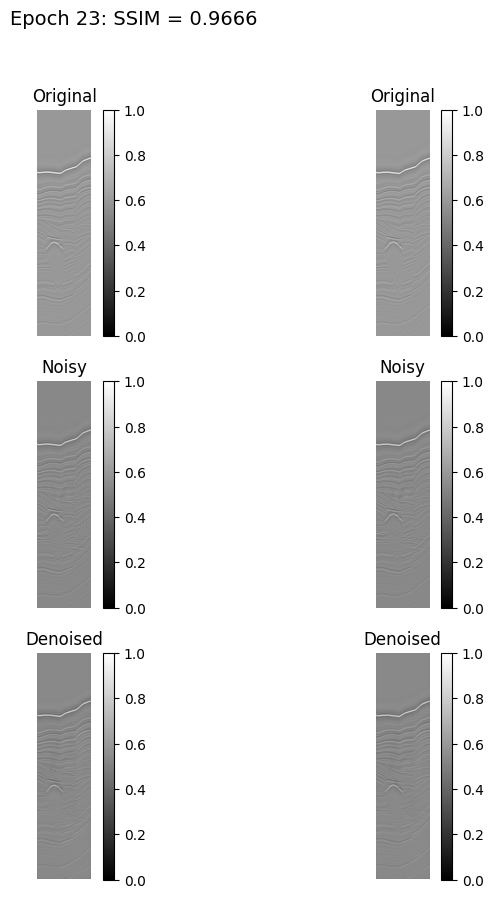

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 851ms/step - loss: 0.0304 - val_loss: 0.0264
Epoch 24/75


2025-04-06 13:16:48.549945: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 894 of 1000
2025-04-06 13:16:50.256946: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - loss: 0.0291

2025-04-06 13:17:14.437673: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:17:14.437750: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:17:27.625546: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:17:27.625588: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


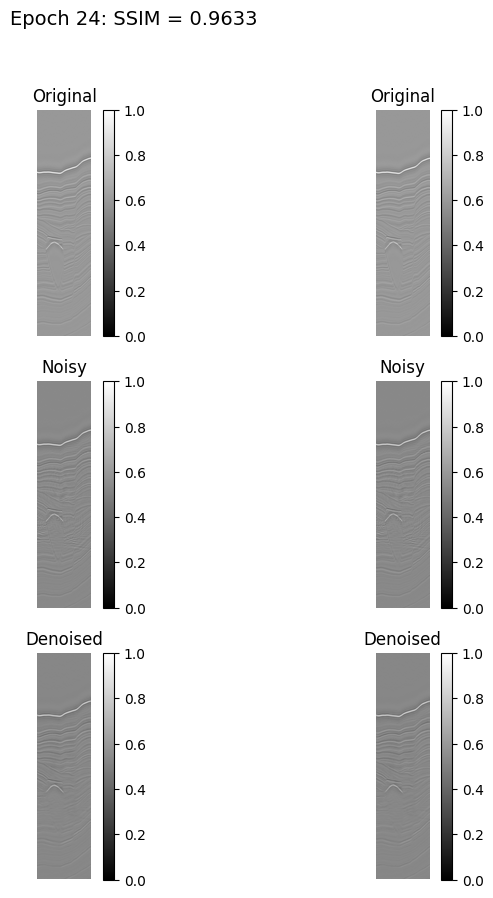

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 844ms/step - loss: 0.0291 - val_loss: 0.0294
Epoch 25/75


2025-04-06 13:17:50.463947: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 884 of 1000
2025-04-06 13:17:52.251586: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - loss: 0.0297

2025-04-06 13:18:16.458342: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:18:16.458412: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:18:29.583695: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:18:29.583741: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


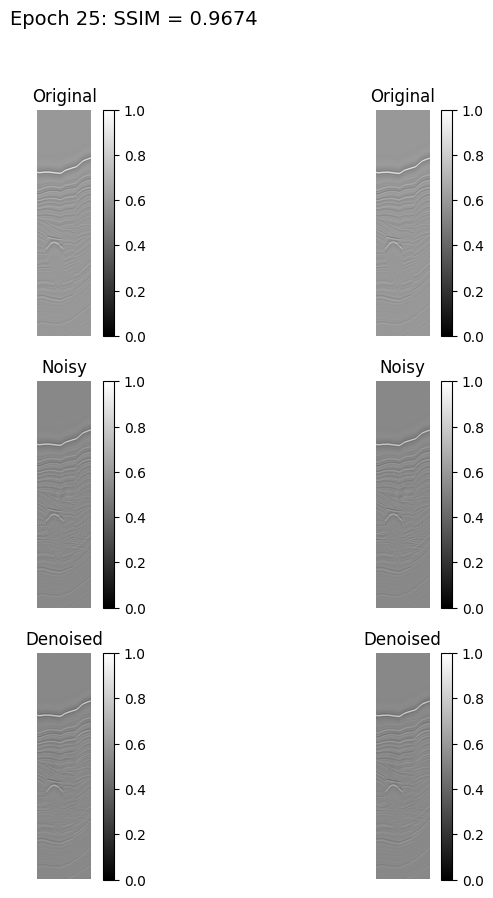

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 845ms/step - loss: 0.0297 - val_loss: 0.0256
Epoch 26/75


2025-04-06 13:18:52.509216: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 886 of 1000
2025-04-06 13:18:54.232165: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - loss: 0.0299

2025-04-06 13:19:18.402861: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2025-04-06 13:19:18.402934: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:19:18.402967: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:19:31.468947: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:19:31.469022: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


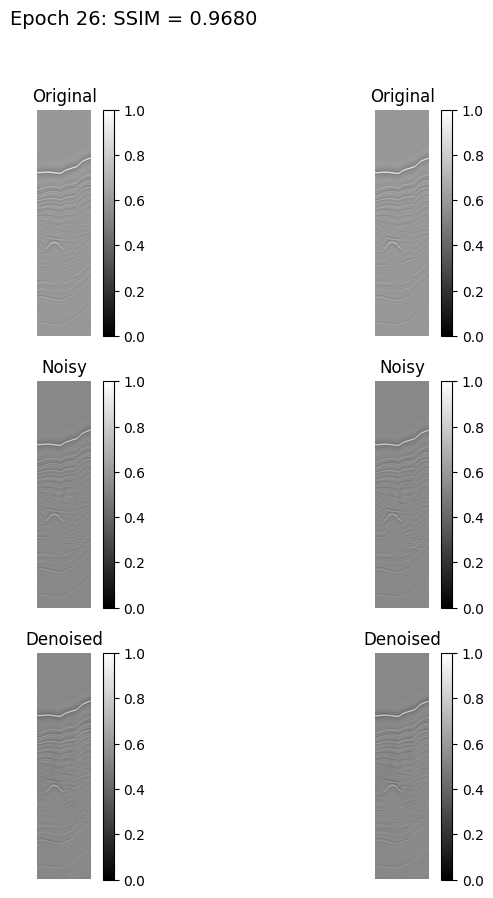

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 841ms/step - loss: 0.0299 - val_loss: 0.0254
Epoch 27/75


2025-04-06 13:19:54.265311: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 876 of 1000
2025-04-06 13:19:56.101959: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step - loss: 0.0291

2025-04-06 13:20:33.245190: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:20:33.245263: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


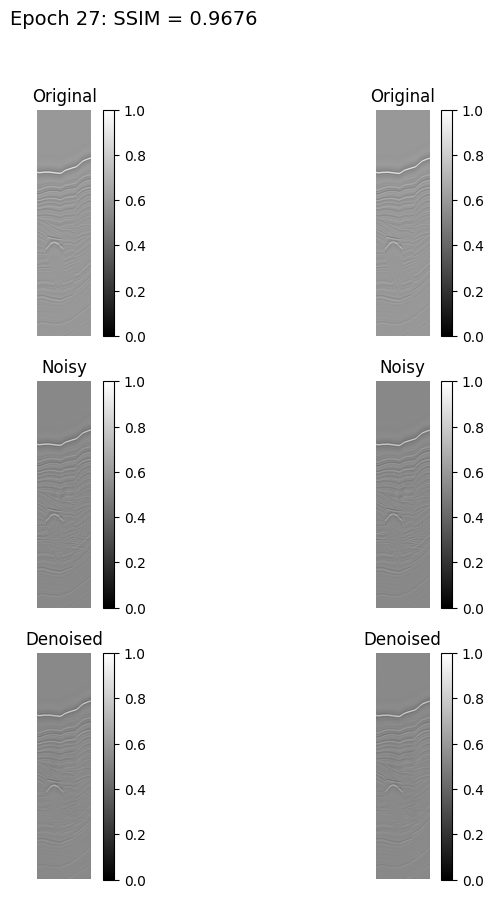

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 840ms/step - loss: 0.0291 - val_loss: 0.0256
Epoch 28/75


2025-04-06 13:20:56.061572: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 882 of 1000
2025-04-06 13:20:57.867359: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step - loss: 0.0292

2025-04-06 13:21:21.891925: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:21:21.892000: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:21:35.097115: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:21:35.097162: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


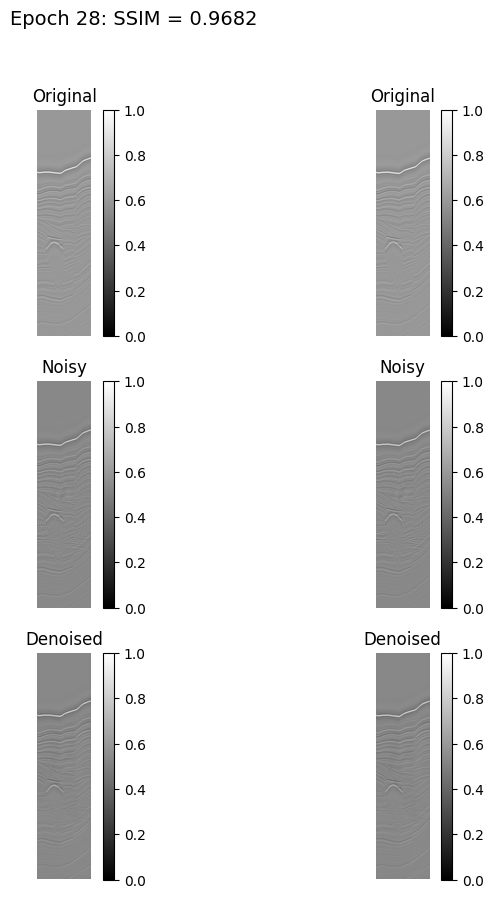

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 841ms/step - loss: 0.0292 - val_loss: 0.0260
Epoch 29/75


2025-04-06 13:21:57.915931: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 887 of 1000
2025-04-06 13:21:59.660689: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step - loss: 0.0281

2025-04-06 13:22:24.121576: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:22:24.121654: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:22:37.303609: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:22:37.303680: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


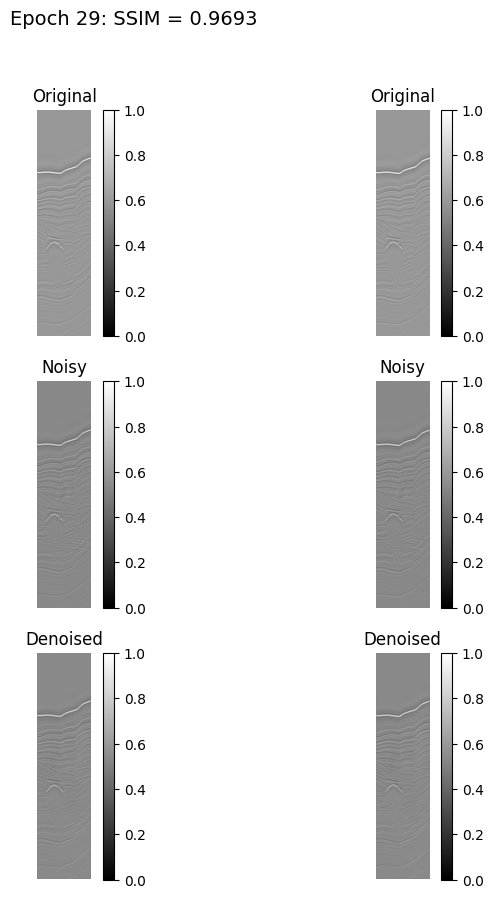

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 849ms/step - loss: 0.0281 - val_loss: 0.0246
Epoch 30/75


2025-04-06 13:23:00.152624: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 875 of 1000
2025-04-06 13:23:01.977592: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - loss: 0.0285

2025-04-06 13:23:26.138120: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:23:26.138196: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:23:39.365138: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:23:39.365208: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


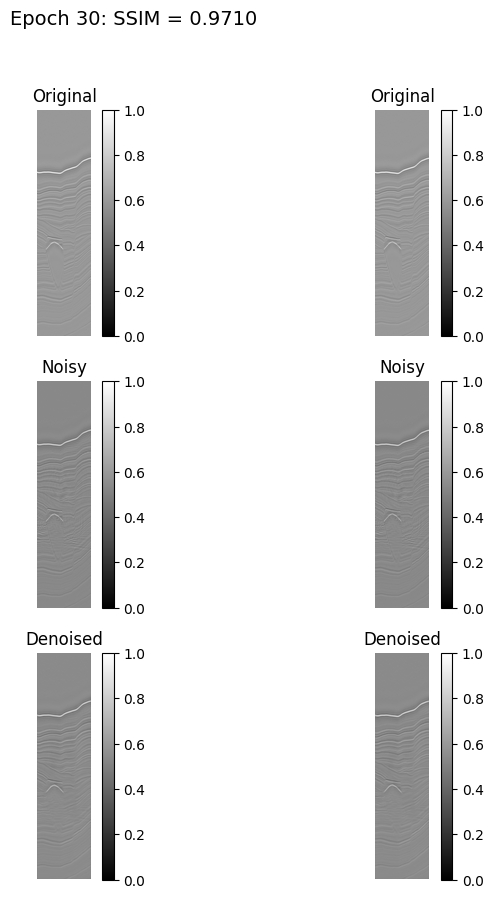

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 848ms/step - loss: 0.0285 - val_loss: 0.0232
Epoch 31/75


2025-04-06 13:24:02.432540: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 893 of 1000
2025-04-06 13:24:04.160088: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step - loss: 0.0280

2025-04-06 13:24:28.236651: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:24:41.345085: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:24:41.345147: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


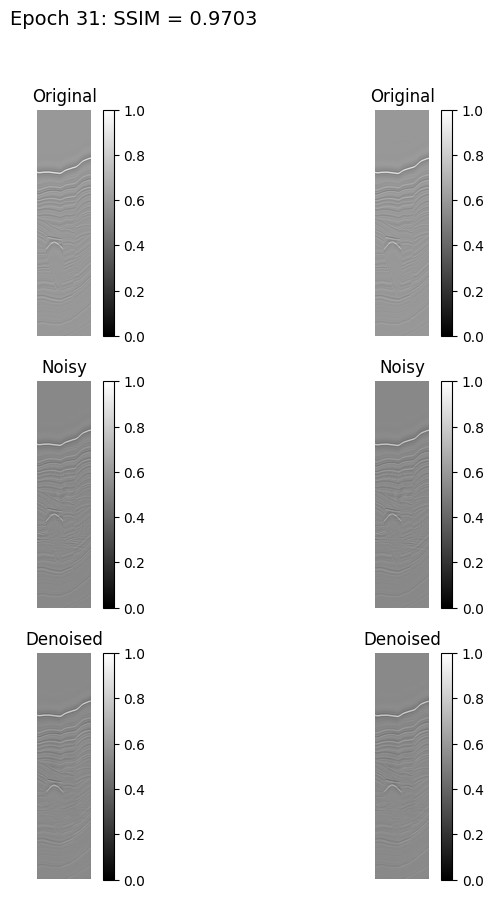

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 841ms/step - loss: 0.0280 - val_loss: 0.0240
Epoch 32/75


2025-04-06 13:25:04.212055: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 885 of 1000
2025-04-06 13:25:05.980887: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - loss: 0.0277

2025-04-06 13:25:30.166882: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:25:30.166956: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


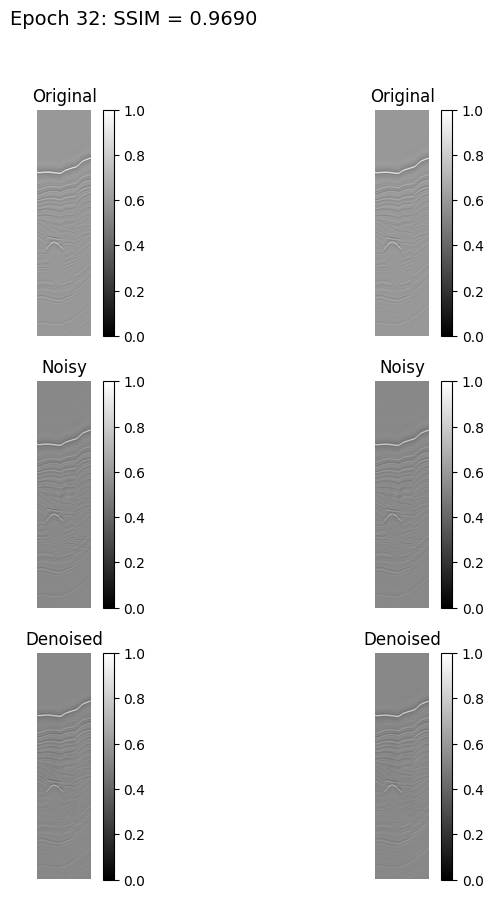

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 839ms/step - loss: 0.0277 - val_loss: 0.0252
Epoch 33/75


2025-04-06 13:26:05.890530: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 874 of 1000
2025-04-06 13:26:07.748671: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step - loss: 0.0271

2025-04-06 13:26:31.963745: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:26:31.963829: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:26:45.275105: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:26:45.275182: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


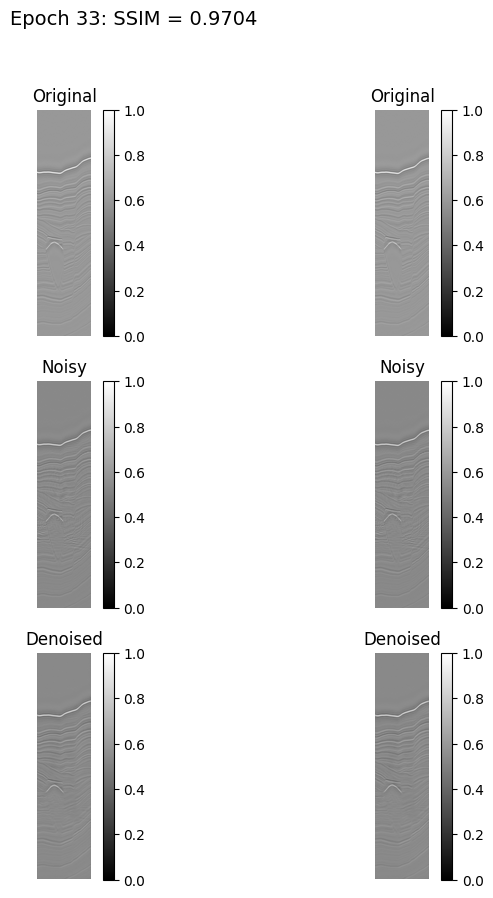

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 849ms/step - loss: 0.0271 - val_loss: 0.0243
Epoch 34/75


2025-04-06 13:27:08.286051: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 873 of 1000
2025-04-06 13:27:10.123251: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - loss: 0.0267

2025-04-06 13:27:34.273973: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:27:47.691749: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:27:47.691842: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


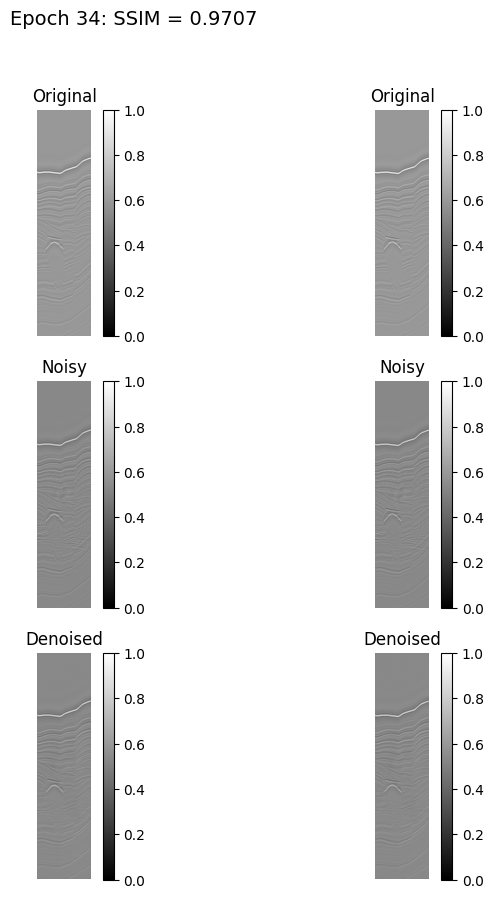

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 847ms/step - loss: 0.0267 - val_loss: 0.0239
Epoch 35/75


2025-04-06 13:28:10.512232: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 870 of 1000
2025-04-06 13:28:12.420667: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step - loss: 0.0269

2025-04-06 13:28:36.452746: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:28:36.452836: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:28:49.615433: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:28:49.615502: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


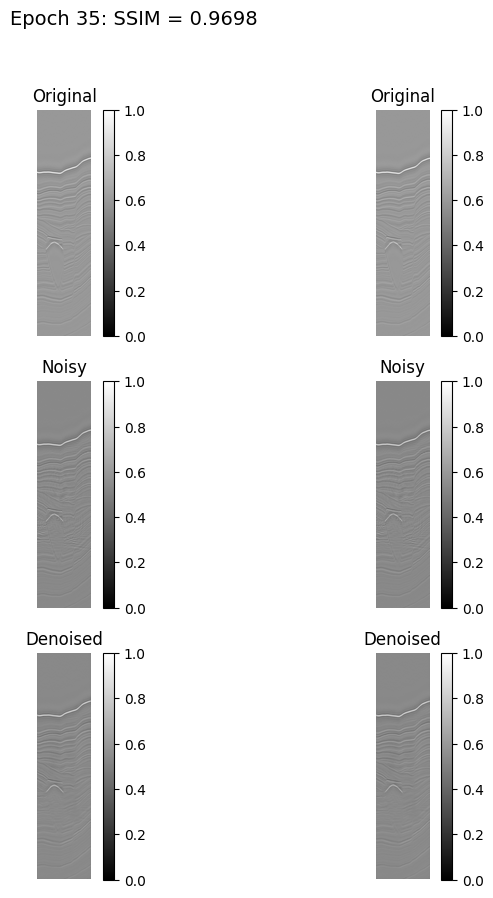

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 839ms/step - loss: 0.0269 - val_loss: 0.0247
Epoch 36/75


2025-04-06 13:29:12.341603: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 884 of 1000
2025-04-06 13:29:14.127618: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step - loss: 0.0272

2025-04-06 13:29:52.101202: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:29:52.101275: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


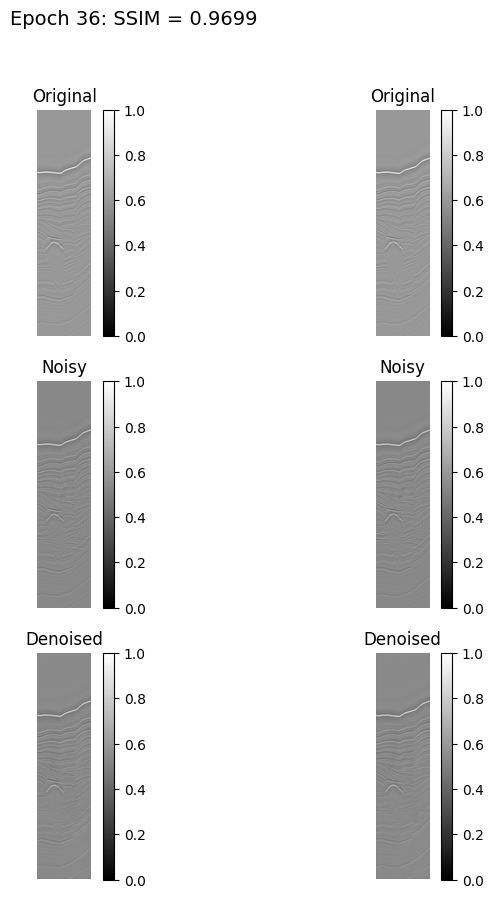

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 852ms/step - loss: 0.0272 - val_loss: 0.0242
Epoch 37/75


2025-04-06 13:30:14.787803: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 884 of 1000
2025-04-06 13:30:16.556250: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step - loss: 0.0269

2025-04-06 13:30:53.853507: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:30:53.853573: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


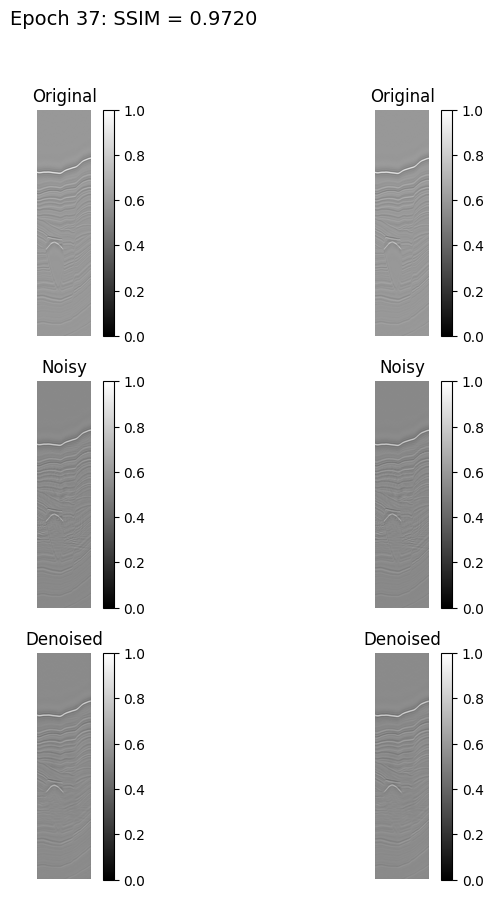

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 847ms/step - loss: 0.0269 - val_loss: 0.0226
Epoch 38/75


2025-04-06 13:31:16.938991: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 869 of 1000
2025-04-06 13:31:18.836392: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step - loss: 0.0260

2025-04-06 13:31:42.883295: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:31:42.883372: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:31:56.044396: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:31:56.044473: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


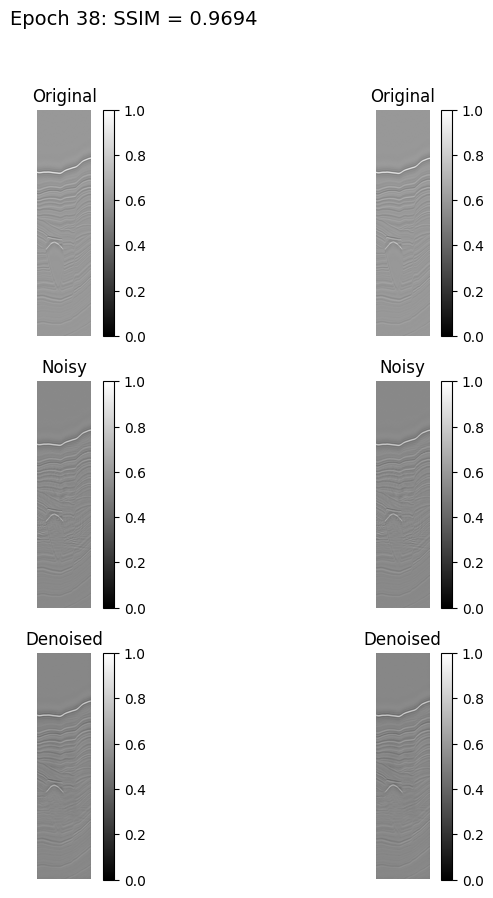

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 842ms/step - loss: 0.0260 - val_loss: 0.0256
Epoch 39/75


2025-04-06 13:32:18.934886: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 881 of 1000
2025-04-06 13:32:20.733451: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step - loss: 0.0262

2025-04-06 13:32:44.883364: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:32:58.247172: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:32:58.247246: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


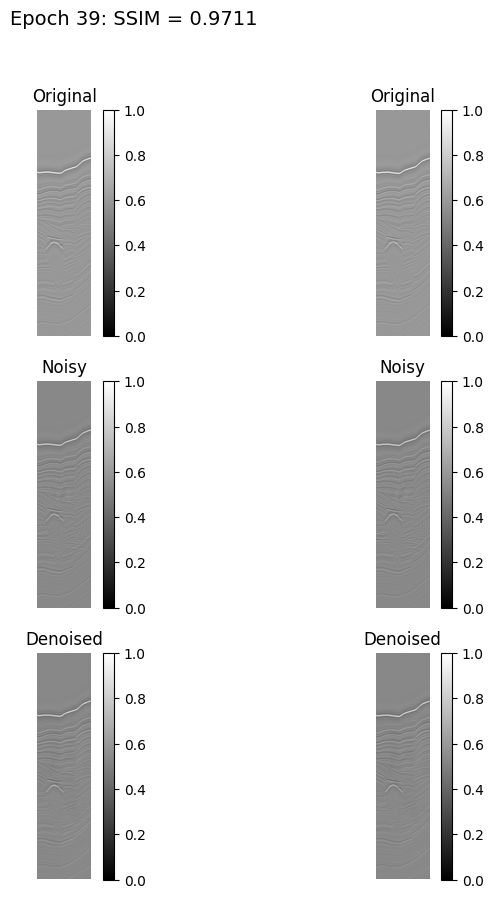

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 844ms/step - loss: 0.0262 - val_loss: 0.0240
Epoch 40/75


2025-04-06 13:33:20.968757: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 876 of 1000
2025-04-06 13:33:22.809886: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - loss: 0.0259

2025-04-06 13:33:47.001139: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:33:47.001221: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:34:00.313739: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:34:00.313806: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


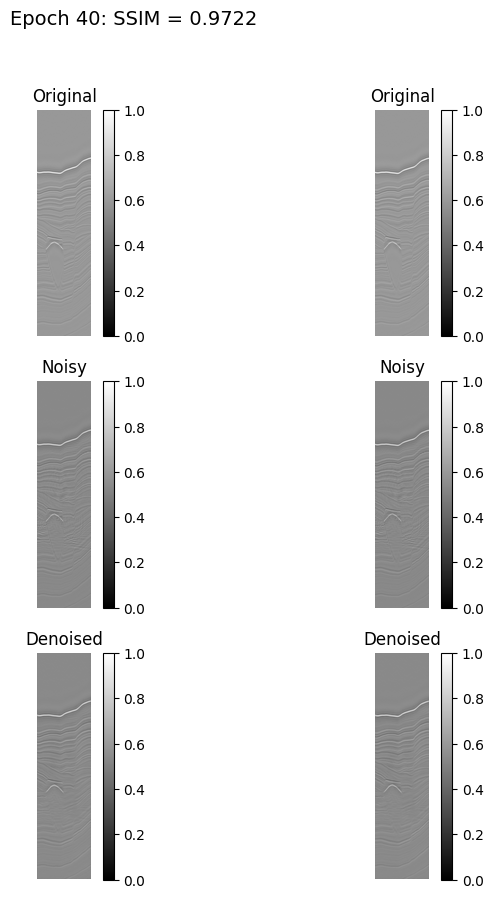

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 845ms/step - loss: 0.0259 - val_loss: 0.0229
Epoch 41/75


2025-04-06 13:34:23.102751: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 893 of 1000
2025-04-06 13:34:24.814175: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step - loss: 0.0258

2025-04-06 13:34:49.030688: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:34:49.030768: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:35:02.221750: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:35:02.221842: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


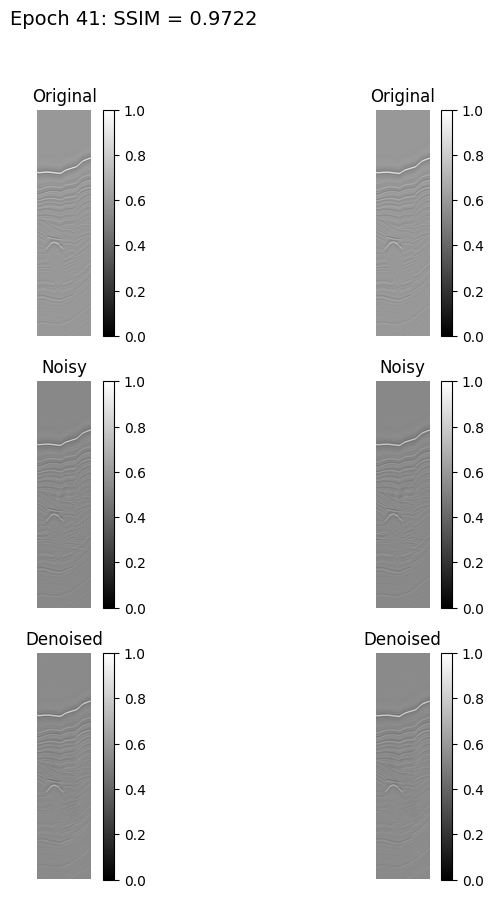

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 843ms/step - loss: 0.0258 - val_loss: 0.0231
Epoch 42/75


2025-04-06 13:35:24.941401: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 881 of 1000
2025-04-06 13:35:26.747088: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - loss: 0.0261

2025-04-06 13:35:50.934082: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:36:04.202037: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:36:04.202116: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


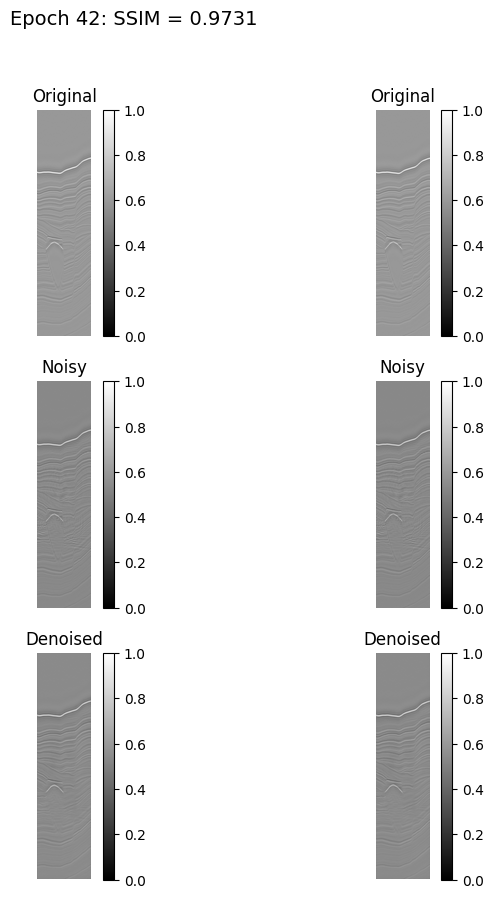

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 850ms/step - loss: 0.0261 - val_loss: 0.0220
Epoch 43/75


2025-04-06 13:36:27.287252: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 879 of 1000
2025-04-06 13:36:29.112704: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step - loss: 0.0255

2025-04-06 13:37:06.699187: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:37:06.699261: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


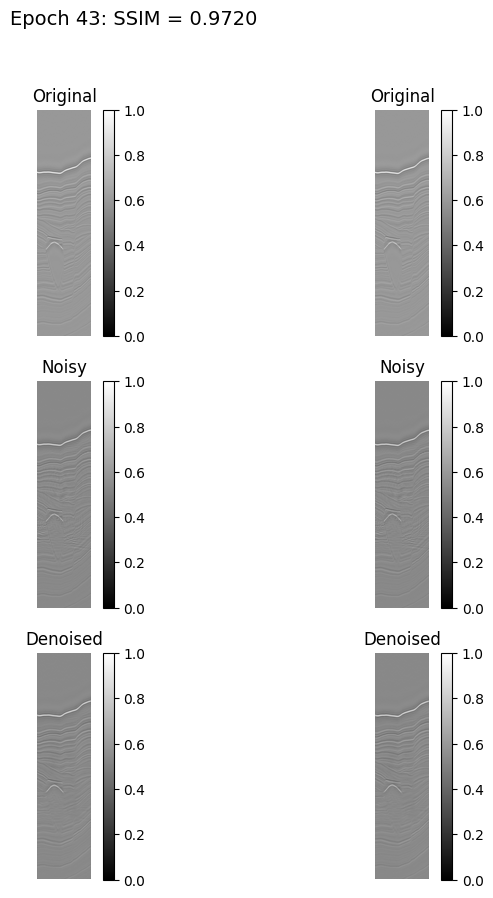

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 849ms/step - loss: 0.0256 - val_loss: 0.0234
Epoch 44/75


2025-04-06 13:37:29.612441: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 895 of 1000
2025-04-06 13:37:31.303255: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step - loss: 0.0257

2025-04-06 13:37:55.276672: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:37:55.276750: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:38:08.383199: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:38:08.383271: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


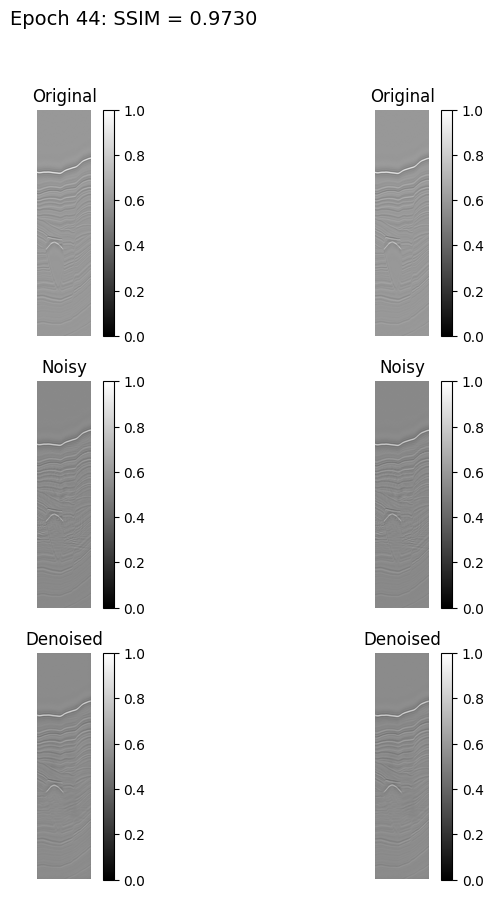

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 840ms/step - loss: 0.0257 - val_loss: 0.0223
Epoch 45/75


2025-04-06 13:38:31.292035: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 893 of 1000
2025-04-06 13:38:32.993001: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step - loss: 0.0259

2025-04-06 13:39:10.344938: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:39:10.345006: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


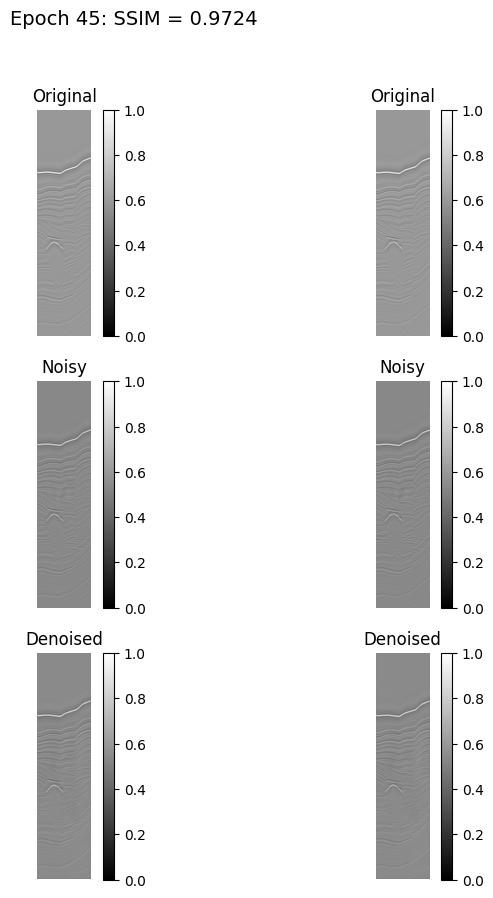

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 847ms/step - loss: 0.0259 - val_loss: 0.0227
Epoch 46/75


2025-04-06 13:39:33.362080: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 889 of 1000
2025-04-06 13:39:35.085579: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step - loss: 0.0260

2025-04-06 13:39:59.218671: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:39:59.218748: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:40:12.348285: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:40:12.348331: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


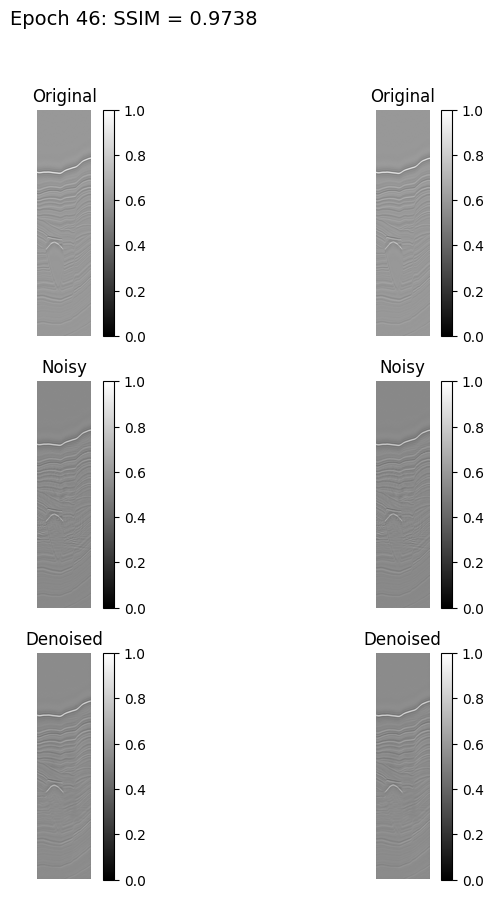

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 840ms/step - loss: 0.0260 - val_loss: 0.0218
Epoch 47/75


2025-04-06 13:40:35.038297: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 873 of 1000
2025-04-06 13:40:36.915829: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - loss: 0.0250

2025-04-06 13:41:01.121437: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:41:01.121511: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:41:14.414714: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:41:14.414791: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


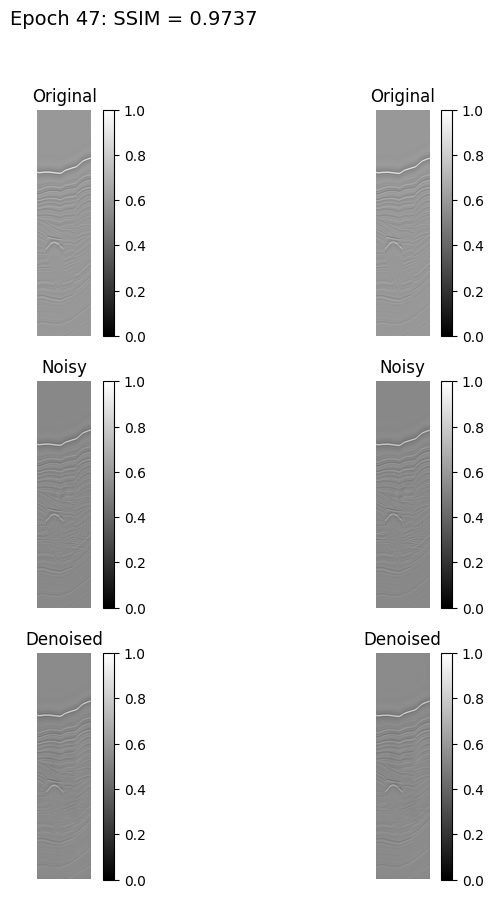

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 847ms/step - loss: 0.0250 - val_loss: 0.0218
Epoch 48/75


2025-04-06 13:41:37.277687: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 895 of 1000
2025-04-06 13:41:38.979416: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - loss: 0.0252

2025-04-06 13:42:03.187845: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:42:03.187914: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:42:16.575083: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:42:16.575153: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


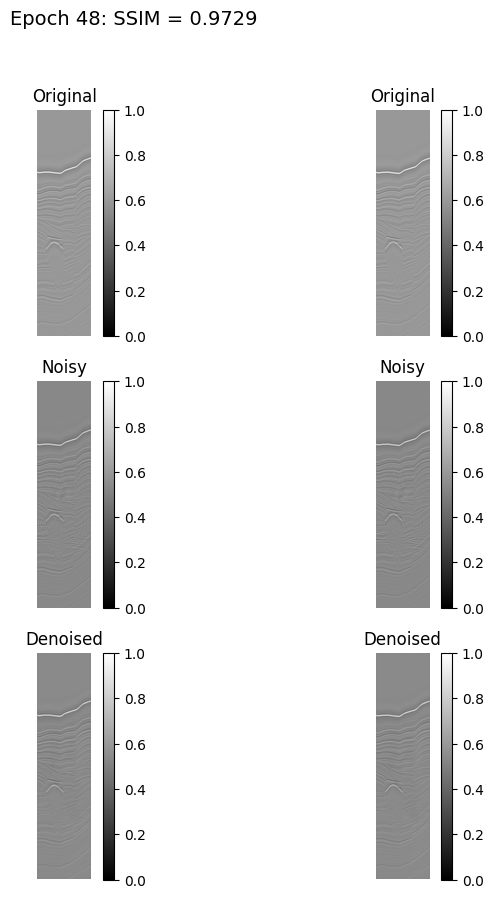

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 847ms/step - loss: 0.0252 - val_loss: 0.0226
Epoch 49/75


2025-04-06 13:42:39.345773: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 900 of 1000
2025-04-06 13:42:41.043629: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step - loss: 0.0244

2025-04-06 13:43:05.281063: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:43:05.281101: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:43:18.609848: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:43:18.609920: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


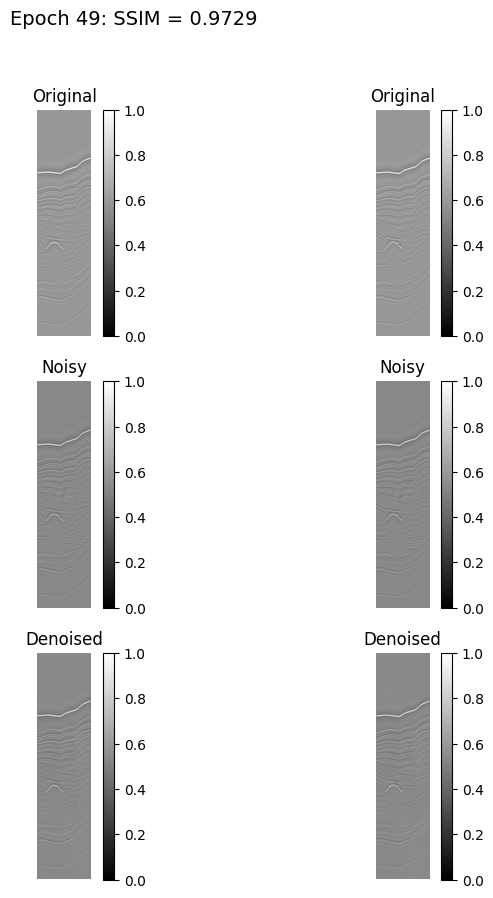

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 850ms/step - loss: 0.0244 - val_loss: 0.0223
Epoch 50/75


2025-04-06 13:43:41.626286: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 878 of 1000
2025-04-06 13:43:43.458911: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step - loss: 0.0248

2025-04-06 13:44:20.917582: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:44:20.917658: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


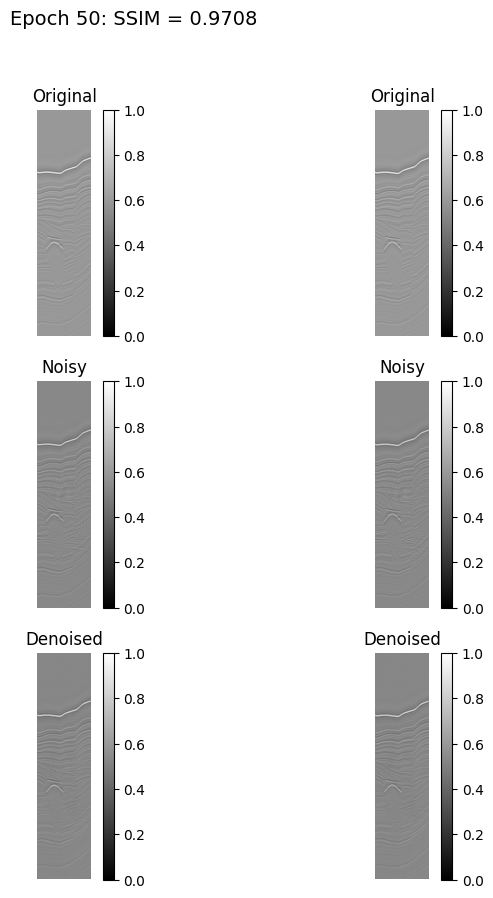

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 845ms/step - loss: 0.0248 - val_loss: 0.0244
Epoch 51/75


2025-04-06 13:44:43.703274: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 864 of 1000
2025-04-06 13:44:45.650662: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step - loss: 0.0248

2025-04-06 13:45:23.011049: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_2]]
2025-04-06 13:45:23.011095: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:45:23.011112: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


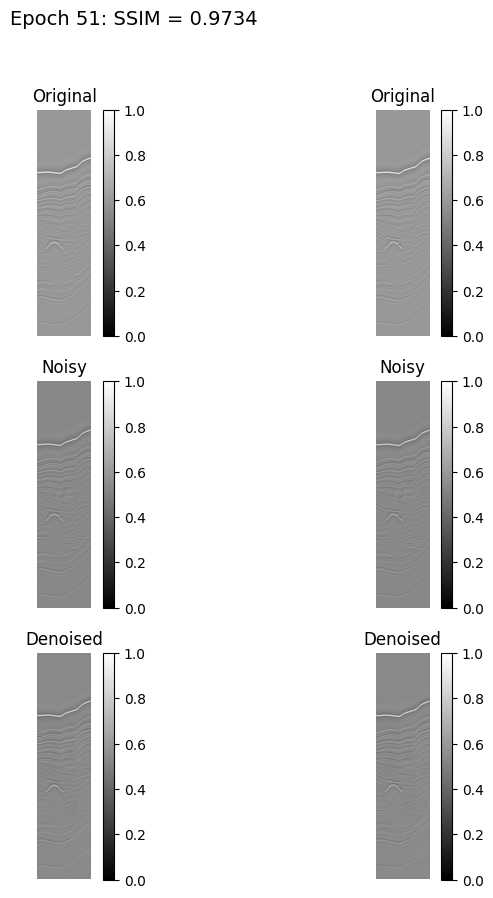

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 847ms/step - loss: 0.0248 - val_loss: 0.0218
Epoch 52/75


2025-04-06 13:45:46.008476: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 881 of 1000
2025-04-06 13:45:47.816165: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step - loss: 0.0245

2025-04-06 13:46:11.870151: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:46:11.870227: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:46:25.253968: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:46:25.254037: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


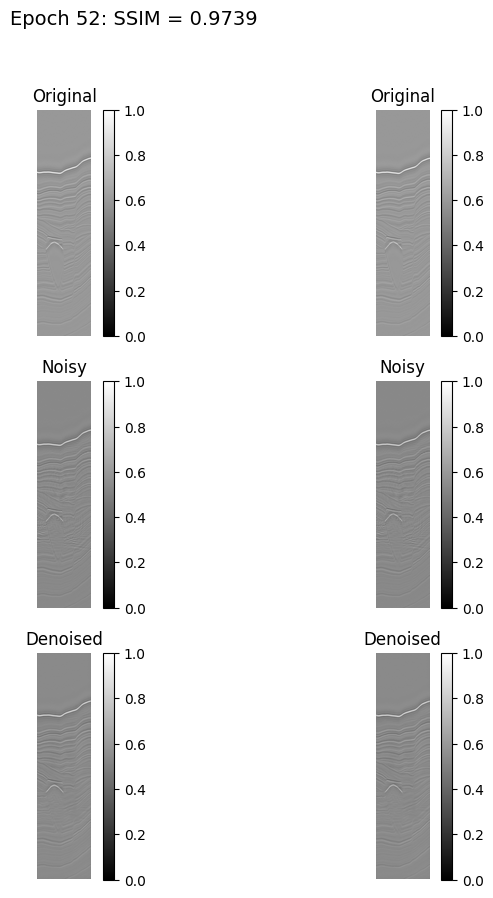

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 843ms/step - loss: 0.0245 - val_loss: 0.0219
Epoch 53/75


2025-04-06 13:46:47.939988: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 884 of 1000
2025-04-06 13:46:49.703610: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step - loss: 0.0243

2025-04-06 13:47:26.953920: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:47:26.953992: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


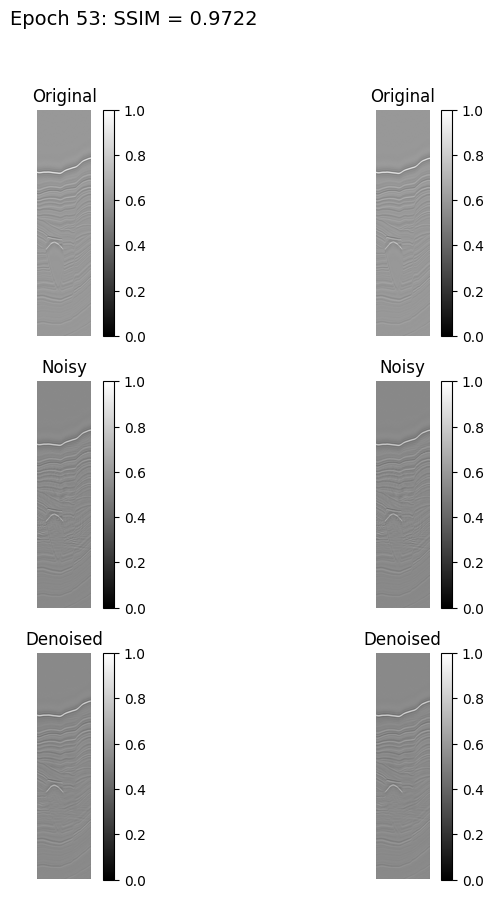

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 847ms/step - loss: 0.0243 - val_loss: 0.0224
Epoch 54/75


2025-04-06 13:47:50.083461: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 885 of 1000
2025-04-06 13:47:51.872160: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - loss: 0.0245

2025-04-06 13:48:29.208522: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:48:29.208592: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


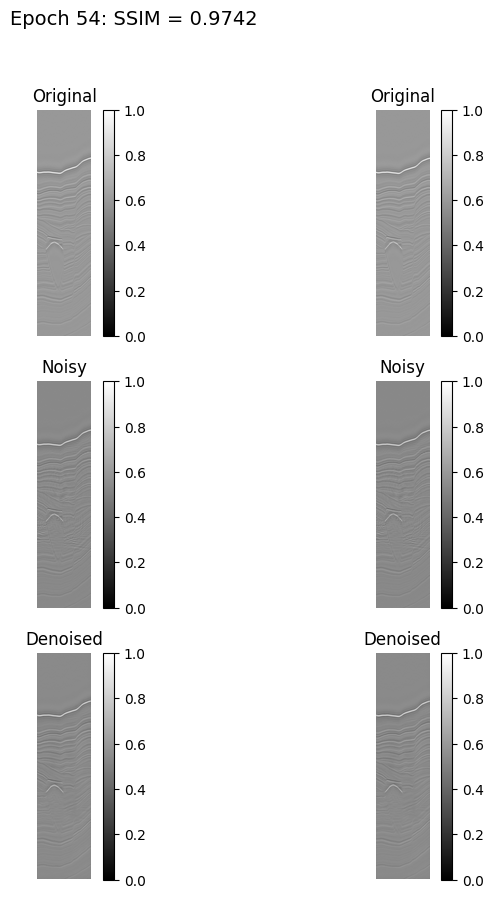

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 845ms/step - loss: 0.0245 - val_loss: 0.0218
Epoch 55/75


2025-04-06 13:48:52.145247: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 889 of 1000
2025-04-06 13:48:53.867186: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step - loss: 0.0249

2025-04-06 13:49:31.353491: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:49:31.353552: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


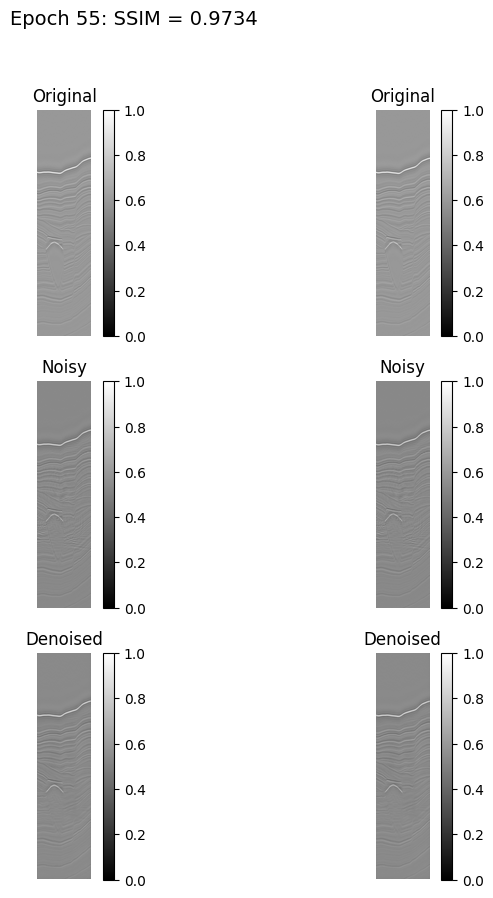

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 846ms/step - loss: 0.0249 - val_loss: 0.0222
Epoch 56/75


2025-04-06 13:49:54.214688: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 880 of 1000
2025-04-06 13:49:56.012497: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step - loss: 0.0245

2025-04-06 13:50:33.777736: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:50:33.777824: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


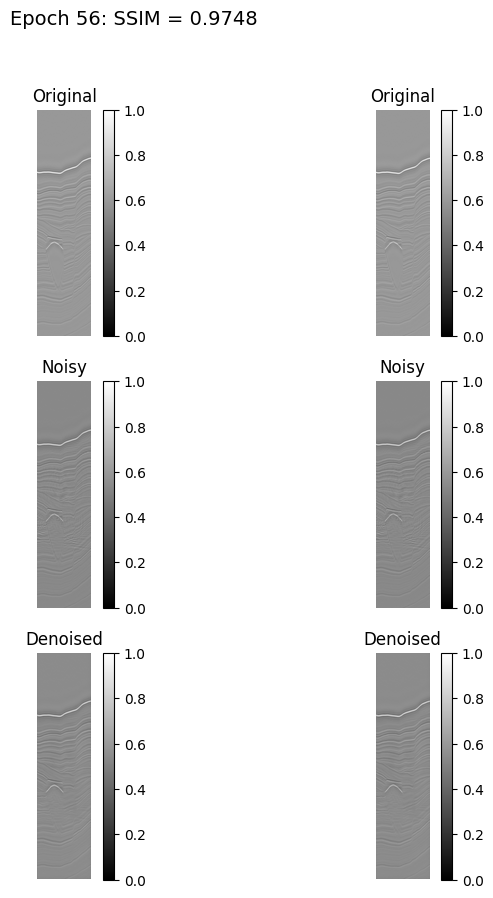

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 848ms/step - loss: 0.0245 - val_loss: 0.0207
Epoch 57/75


2025-04-06 13:50:56.490456: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 876 of 1000
2025-04-06 13:50:58.354830: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step - loss: 0.0237

2025-04-06 13:51:22.429909: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:51:22.429987: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:51:35.563531: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:51:35.563595: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


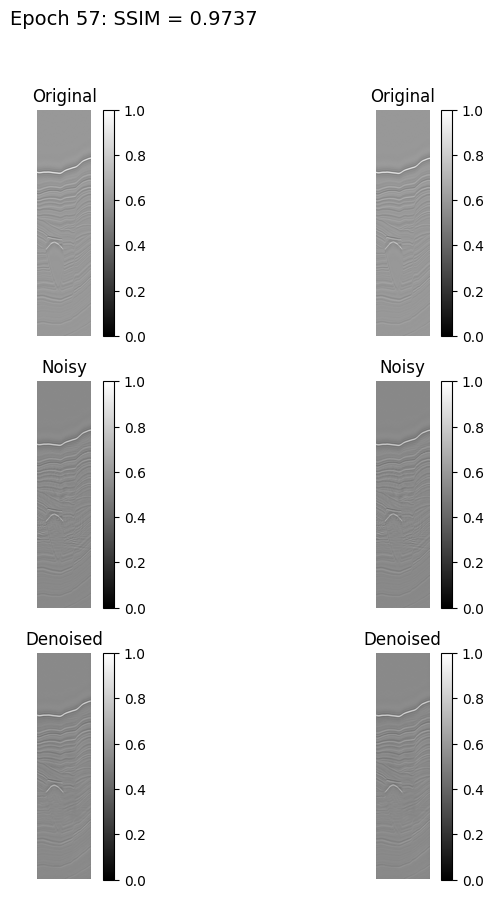

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 841ms/step - loss: 0.0237 - val_loss: 0.0225
Epoch 58/75


2025-04-06 13:51:58.357151: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 871 of 1000
2025-04-06 13:52:00.229715: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step - loss: 0.0238

2025-04-06 13:52:37.535895: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:52:37.535963: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


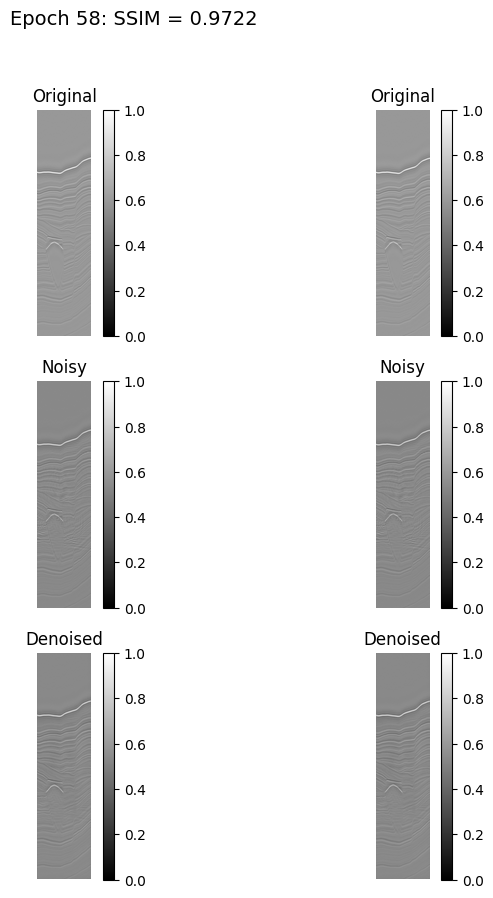

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 847ms/step - loss: 0.0238 - val_loss: 0.0231
Epoch 59/75


2025-04-06 13:53:00.619884: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 872 of 1000
2025-04-06 13:53:02.474107: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step - loss: 0.0237

2025-04-06 13:53:26.486202: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:53:26.486277: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:53:39.862848: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:53:39.862911: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


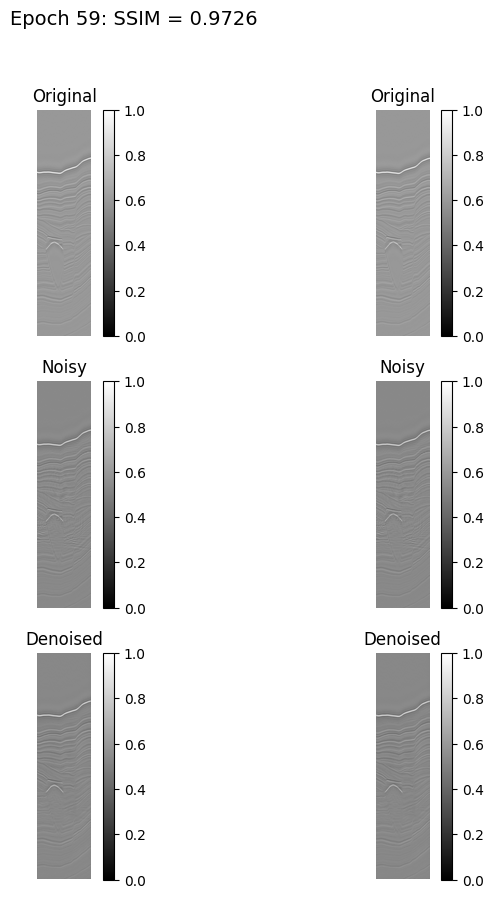

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 846ms/step - loss: 0.0237 - val_loss: 0.0235
Epoch 60/75


2025-04-06 13:54:02.794083: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 891 of 1000
2025-04-06 13:54:04.558958: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step - loss: 0.0236

2025-04-06 13:54:41.813454: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:54:41.813506: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


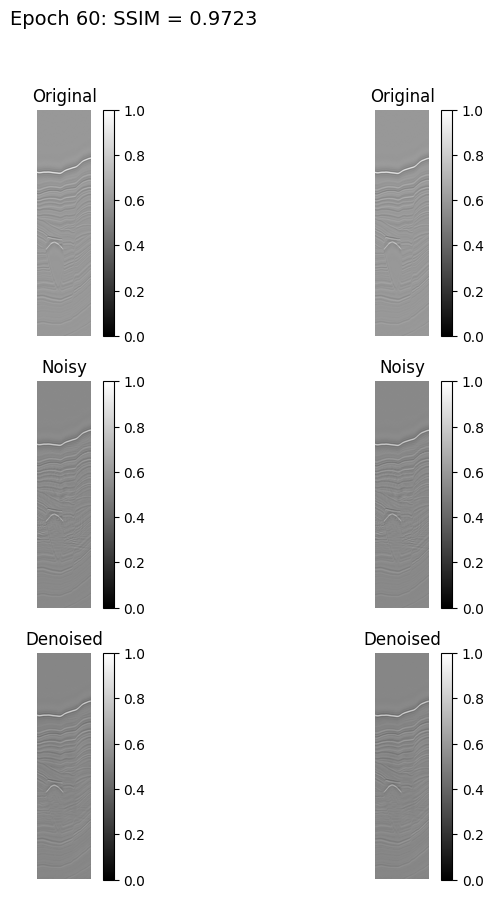

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 843ms/step - loss: 0.0236 - val_loss: 0.0235
Epoch 61/75


2025-04-06 13:55:04.694631: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 878 of 1000
2025-04-06 13:55:06.528748: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - loss: 0.0237

2025-04-06 13:55:30.693090: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:55:30.693169: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:55:43.829150: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:55:43.829225: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


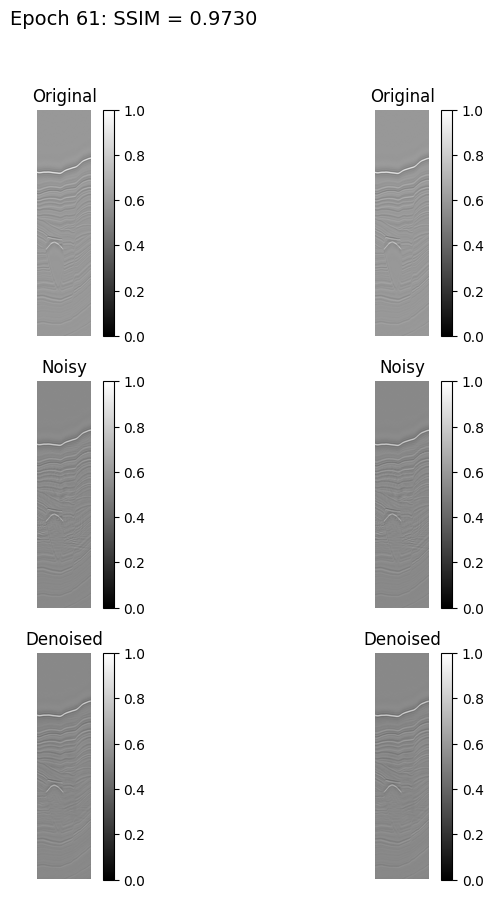

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 844ms/step - loss: 0.0237 - val_loss: 0.0226
Epoch 62/75


2025-04-06 13:56:06.730874: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 886 of 1000
2025-04-06 13:56:08.487950: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - loss: 0.0234

2025-04-06 13:56:32.675906: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:56:32.675980: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


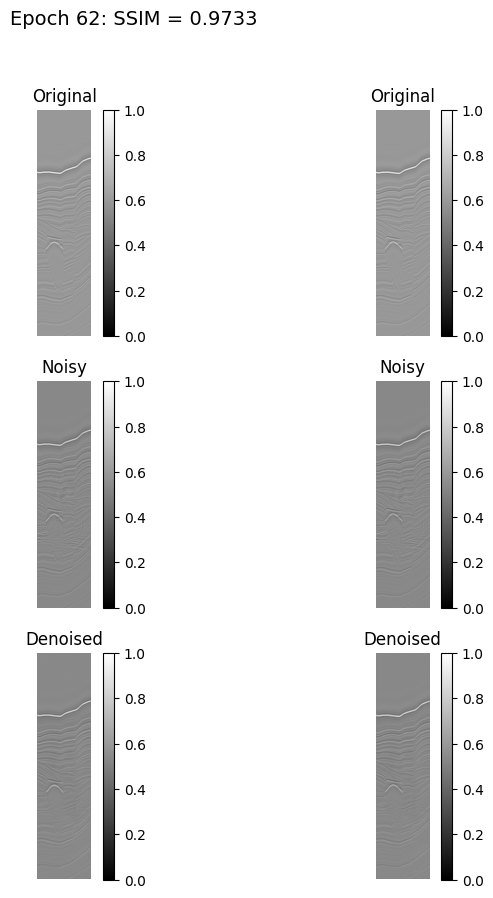

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 844ms/step - loss: 0.0234 - val_loss: 0.0227
Epoch 63/75


2025-04-06 13:57:08.729957: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 856 of 1000
2025-04-06 13:57:10.717660: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step - loss: 0.0231

2025-04-06 13:57:48.431072: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:57:48.431148: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


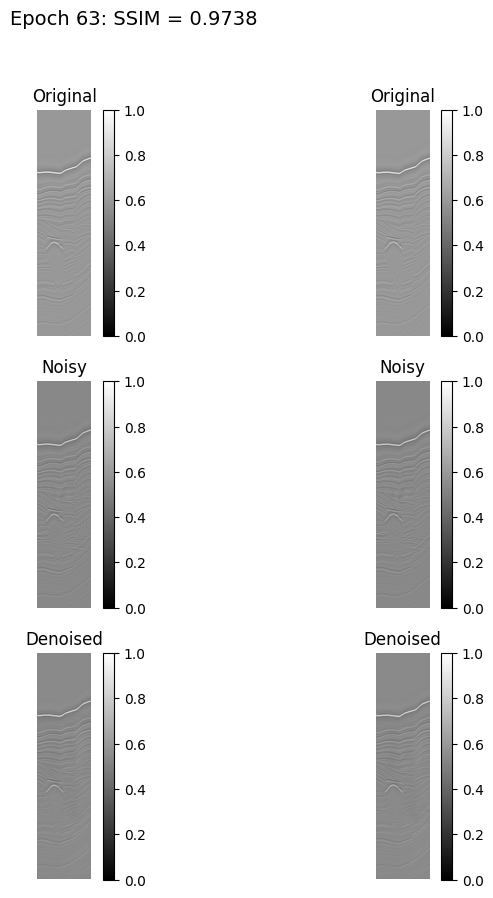

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 847ms/step - loss: 0.0231 - val_loss: 0.0225
Epoch 64/75


2025-04-06 13:58:11.113022: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 877 of 1000
2025-04-06 13:58:12.942919: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step - loss: 0.0233

2025-04-06 13:58:36.999939: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:58:37.000006: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 13:58:50.389077: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:58:50.389151: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


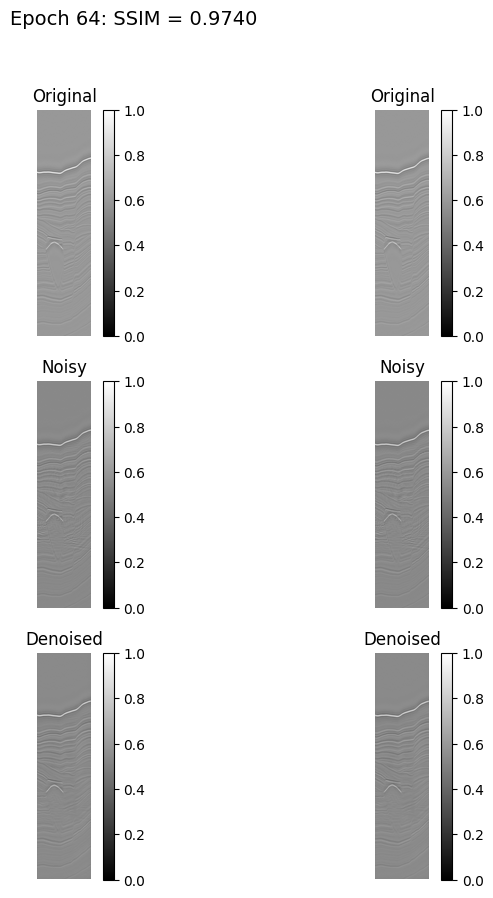

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 845ms/step - loss: 0.0233 - val_loss: 0.0215
Epoch 65/75


2025-04-06 13:59:13.205622: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 887 of 1000
2025-04-06 13:59:15.003094: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step - loss: 0.0229

2025-04-06 13:59:52.264348: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 13:59:52.264424: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


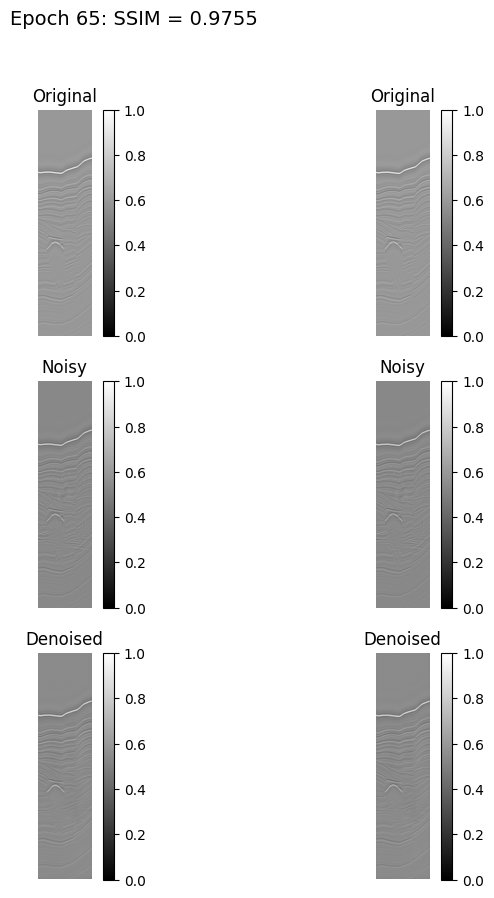

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 844ms/step - loss: 0.0229 - val_loss: 0.0208
Epoch 66/75


2025-04-06 14:00:15.181211: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 884 of 1000
2025-04-06 14:00:16.971959: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step - loss: 0.0243

2025-04-06 14:00:54.033369: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 14:00:54.033443: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


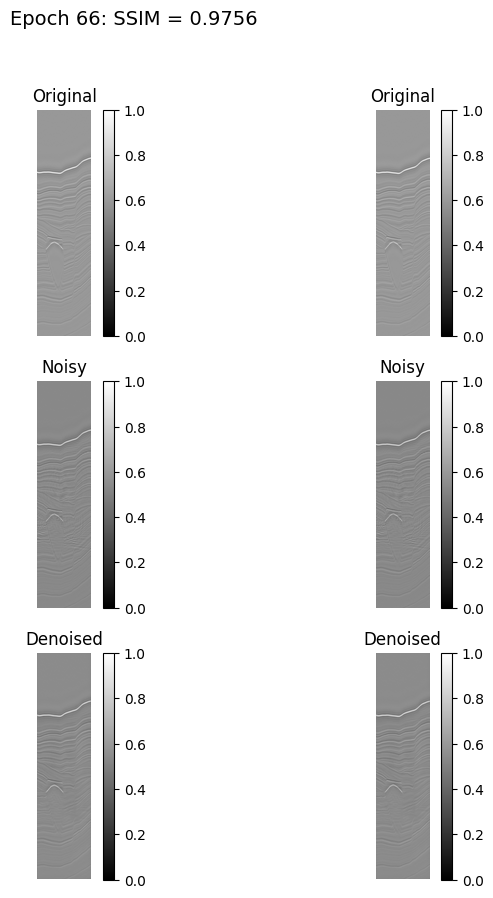

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 839ms/step - loss: 0.0242 - val_loss: 0.0206
Epoch 67/75


2025-04-06 14:01:16.851633: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 888 of 1000
2025-04-06 14:01:18.617358: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step - loss: 0.0235

2025-04-06 14:01:42.708970: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 14:01:55.729996: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 14:01:55.730080: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


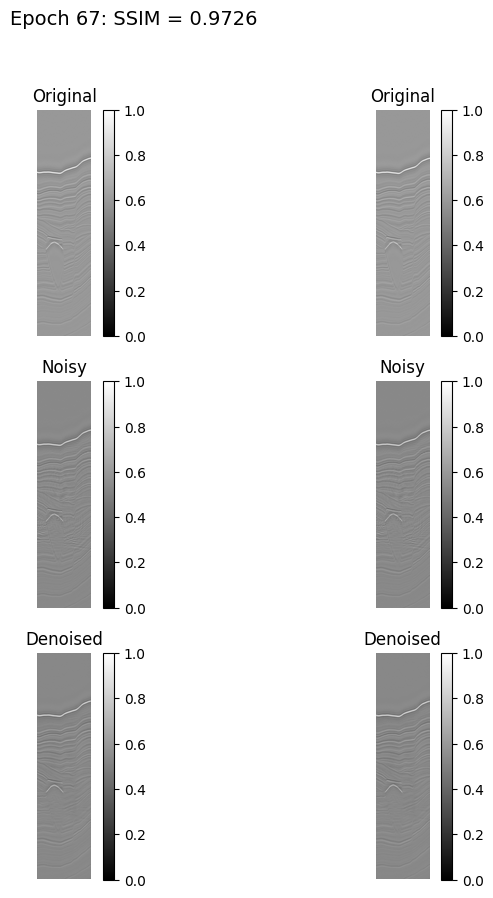

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 841ms/step - loss: 0.0235 - val_loss: 0.0231
Epoch 68/75


2025-04-06 14:02:18.650756: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 896 of 1000
2025-04-06 14:02:20.358130: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - loss: 0.0231

2025-04-06 14:02:44.558356: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 14:02:44.558436: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 14:02:57.808359: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 14:02:57.808440: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


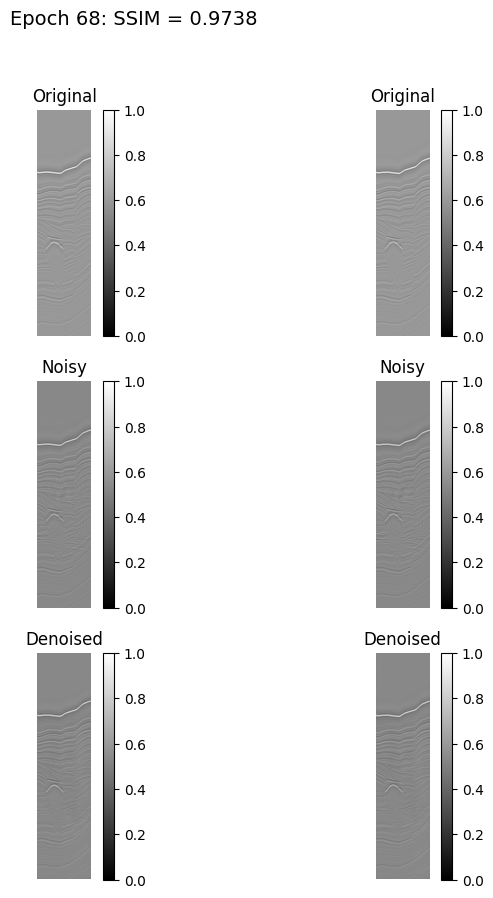

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 844ms/step - loss: 0.0231 - val_loss: 0.0223
Epoch 69/75


2025-04-06 14:03:20.588029: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 873 of 1000
2025-04-06 14:03:22.474761: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step - loss: 0.0229

2025-04-06 14:03:46.887280: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 14:03:46.887355: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 14:04:00.061507: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 14:04:00.061547: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


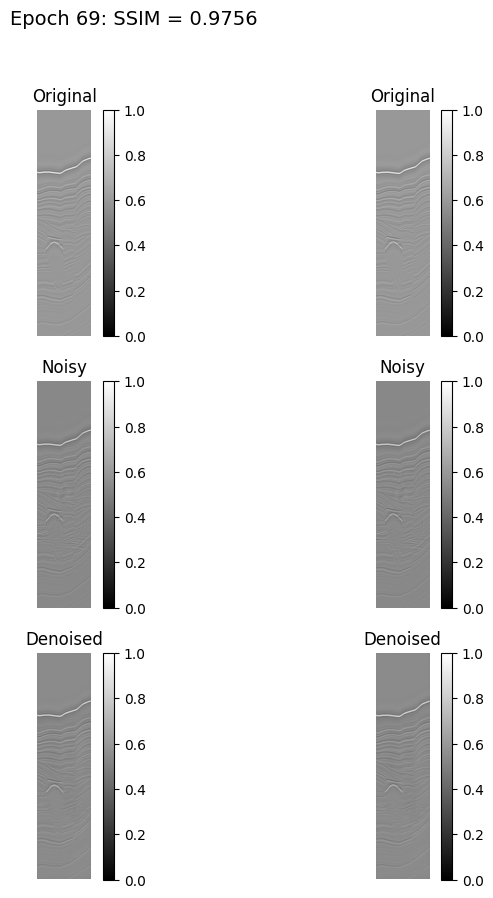

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 846ms/step - loss: 0.0229 - val_loss: 0.0206
Epoch 70/75


2025-04-06 14:04:22.793414: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 879 of 1000
2025-04-06 14:04:24.642437: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step - loss: 0.0229

2025-04-06 14:04:48.766752: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 14:05:01.979916: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 14:05:01.979967: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


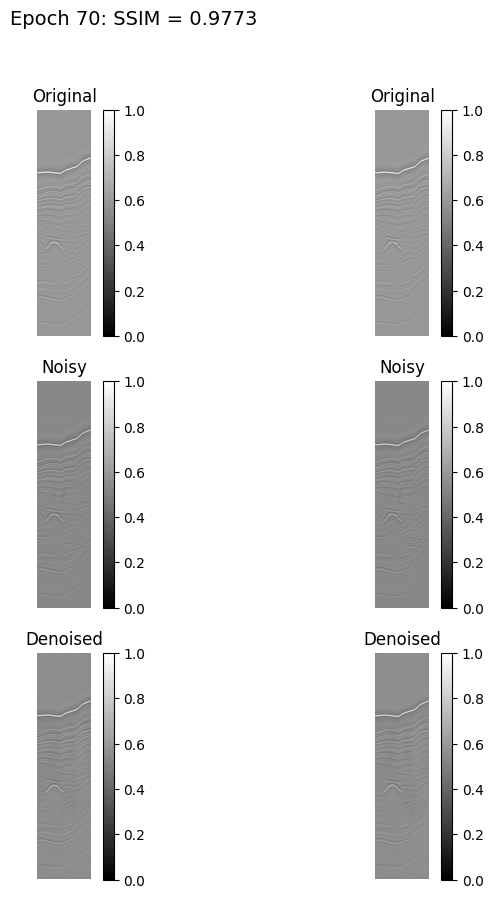

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 847ms/step - loss: 0.0229 - val_loss: 0.0192
Epoch 71/75


2025-04-06 14:05:25.026185: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 880 of 1000
2025-04-06 14:05:26.819709: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step - loss: 0.0232

2025-04-06 14:05:50.858385: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 14:05:50.858461: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 14:06:04.023118: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 14:06:04.023184: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


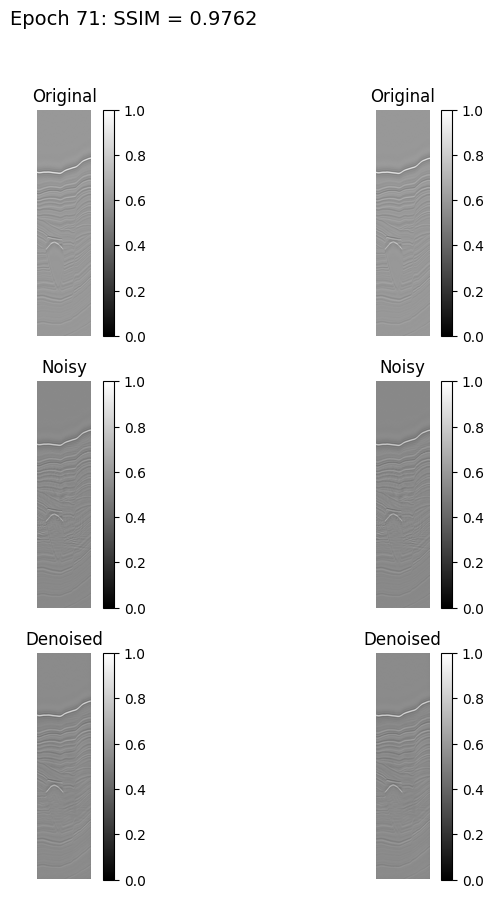

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 841ms/step - loss: 0.0232 - val_loss: 0.0204
Epoch 72/75


2025-04-06 14:06:26.863240: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 878 of 1000
2025-04-06 14:06:28.680267: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step - loss: 0.0230

2025-04-06 14:06:52.660531: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 14:07:05.760992: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 14:07:05.761065: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


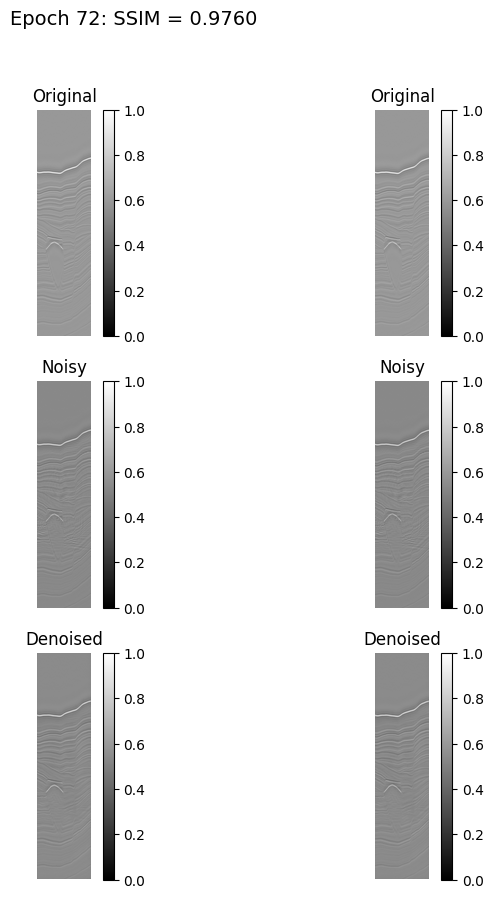

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 840ms/step - loss: 0.0230 - val_loss: 0.0206
Epoch 73/75


2025-04-06 14:07:28.673759: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 886 of 1000
2025-04-06 14:07:30.462447: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - loss: 0.0224

2025-04-06 14:07:54.631849: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 14:07:54.631921: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 14:08:07.751076: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 14:08:07.751152: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


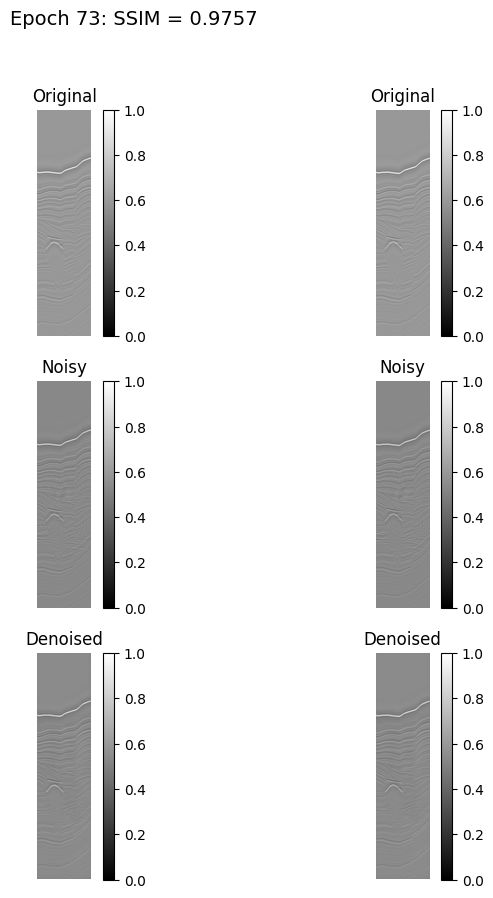

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 846ms/step - loss: 0.0224 - val_loss: 0.0206
Epoch 74/75


2025-04-06 14:08:30.815143: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 881 of 1000
2025-04-06 14:08:32.638260: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step - loss: 0.0225

2025-04-06 14:08:56.772366: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 14:08:56.772443: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 14:09:10.062697: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662


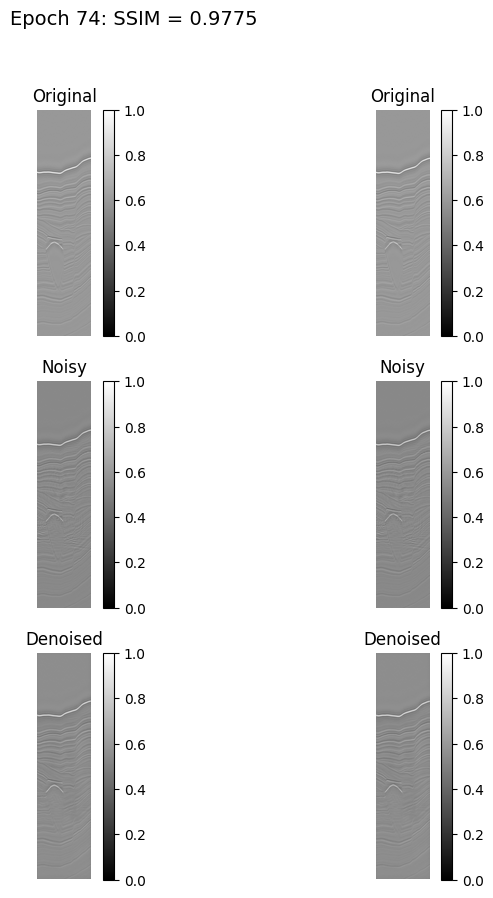

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 843ms/step - loss: 0.0225 - val_loss: 0.0195
Epoch 75/75


2025-04-06 14:09:32.797074: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 897 of 1000
2025-04-06 14:09:34.522987: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step - loss: 0.0232

2025-04-06 14:09:58.753519: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 14:09:58.753600: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268
2025-04-06 14:10:11.878807: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 14067907436286097662
2025-04-06 14:10:11.878851: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 6190657208277485268


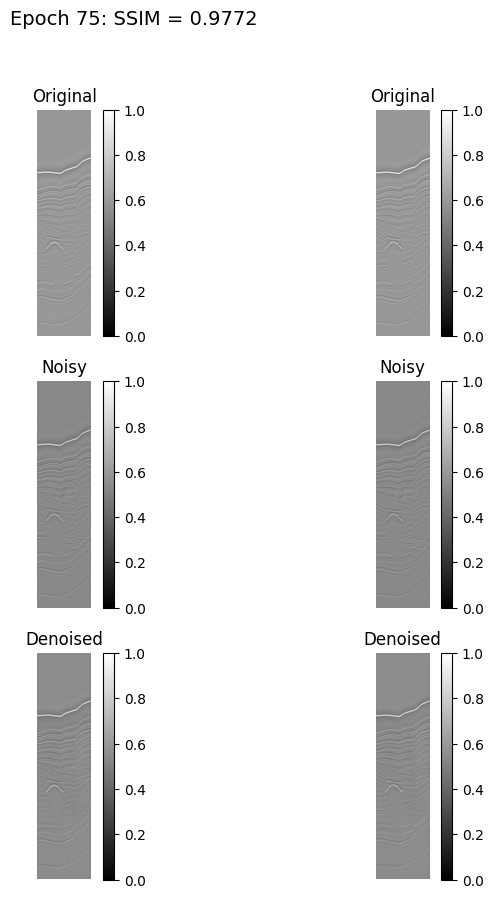

60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 842ms/step - loss: 0.0232 - val_loss: 0.0195


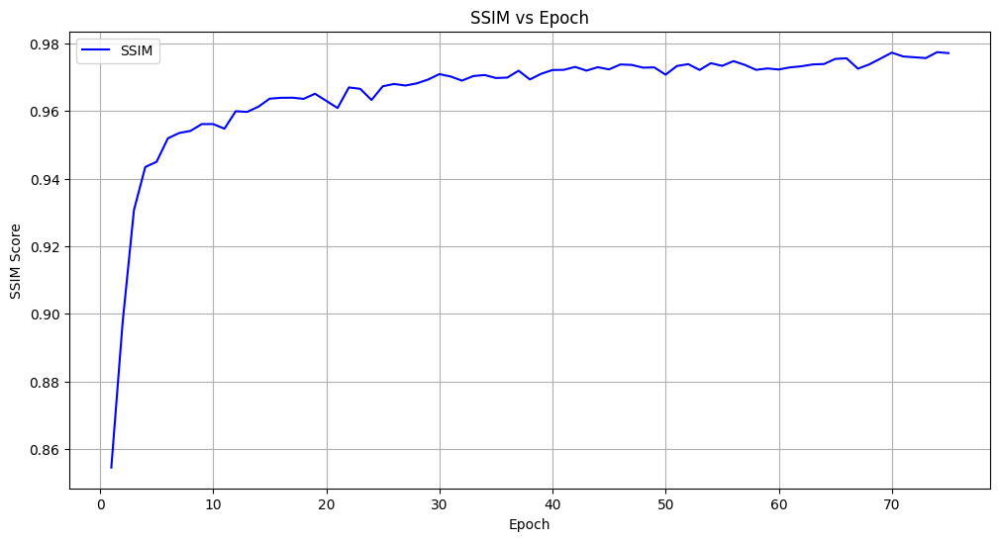

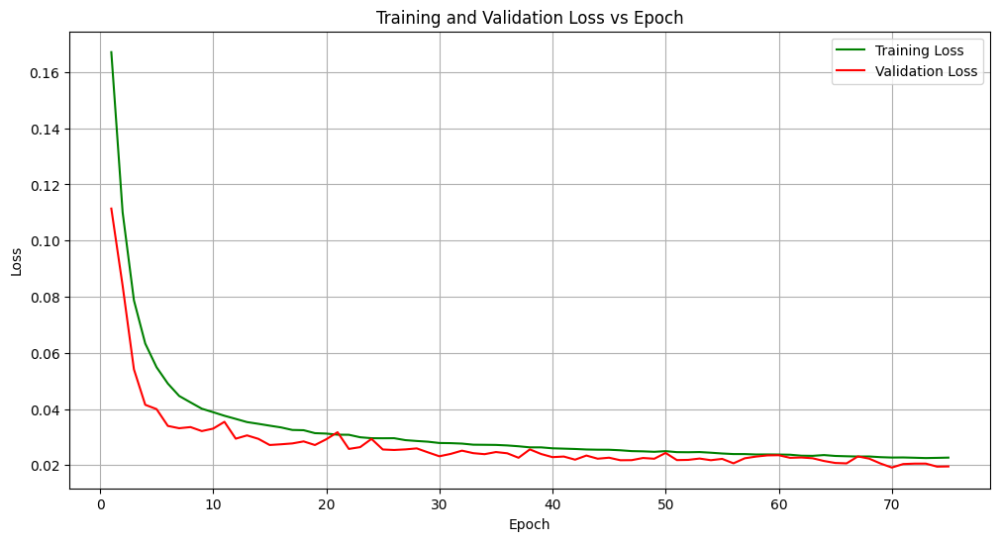

In [7]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from skimage.metrics import structural_similarity as ssim

# Function to visualize a few pairs of noisy and clean training data

def visualize_training_data(train_dataset, num_pairs=3):
    for noisy_batch, clean_batch in train_dataset.take(1):
        fig, axes = plt.subplots(2, num_pairs, figsize=(8, 10))
        
        for i in range(num_pairs):
            # Noisy image
            im1 = axes[0, i].imshow(noisy_batch[i].numpy().squeeze(), cmap='gray', vmin=0, vmax=1)
            axes[0, i].set_title("Noisy", fontsize=12)
            axes[0, i].axis('off')
            fig.colorbar(im1, ax=axes[0, i], fraction=0.046, pad=0.04)  # Add colorbar

            # Clean image
            im2 = axes[1, i].imshow(clean_batch[i].numpy().squeeze(), cmap='gray', vmin=0, vmax=1)
            axes[1, i].set_title("Clean", fontsize=12)
            axes[1, i].axis('off')
            fig.colorbar(im2, ax=axes[1, i], fraction=0.046, pad=0.04)  # Add colorbar

        plt.tight_layout()
        plt.show()

# Run the visualization
visualize_training_data(train_dataset, num_pairs=3)

# Train the model with the callback
history = autoencoder.fit(
    train_dataset,
    epochs=75,  # Adjust as needed
    validation_data=val_dataset,
    callbacks=[DisplayCallback()]
)
autoencoder.save("autoencoder_model.h5")

# Plot training loss, validation loss, and SSIM over epochs
epochs = range(1, len(history.history['loss']) + 1)
plt.figure(figsize=(12, 6))
plt.plot(epochs, history.history['loss'], 'g-', label='Training Loss')
plt.plot(epochs, history.history['val_loss'], 'r-', label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss vs Epoch')
plt.grid(True)
plt.show()


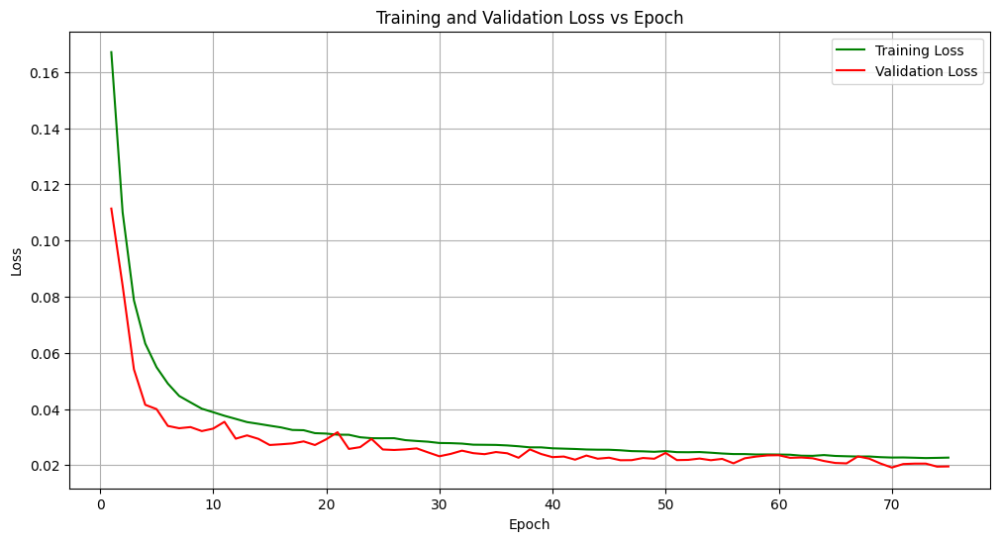

In [8]:

# Plot training loss, validation loss, and SSIM over epochs
epochs = range(1, len(history.history['loss']) + 1)
plt.figure(figsize=(12, 6))
plt.plot(epochs, history.history['loss'], 'g-', label='Training Loss')
plt.plot(epochs, history.history['val_loss'], 'r-', label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss vs Epoch')
plt.grid(True)
plt.show()


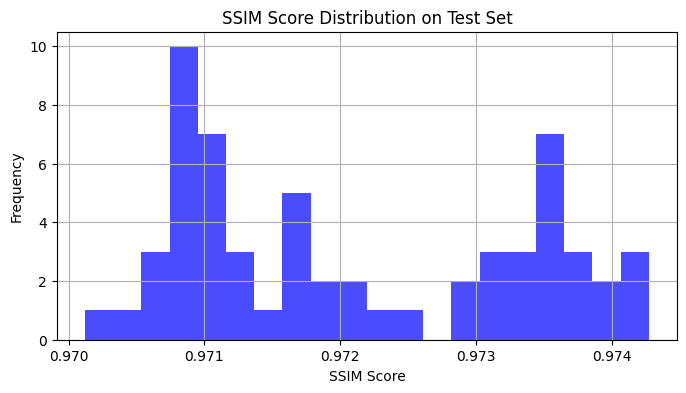

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from skimage.metrics import structural_similarity as ssim
import random

# Compute SSIM on test set
test_ssim_scores = []
noisy_images = []
clean_images = []
denoised_images = []

for noisy_batch, clean_batch in test_dataset:
    # Denoise the noisy images using the model
    denoised_imgs = autoencoder.predict(noisy_batch, verbose=0)

    for i in range(len(clean_batch)):
        score = ssim(clean_batch[i].numpy().squeeze(), 
                     denoised_imgs[i].squeeze(), 
                     data_range=1.0)
        test_ssim_scores.append(score)

        # Store images for visualization
        noisy_images.append(noisy_batch[i].numpy().squeeze())   # Noisy Image
        clean_images.append(clean_batch[i].numpy().squeeze())   # Clean Ground Truth
        denoised_images.append(denoised_imgs[i].squeeze())      # Model Output

# SSIM Distribution Plot
plt.figure(figsize=(8, 4))
plt.hist(test_ssim_scores, bins=20, color='b', alpha=0.7)
plt.xlabel('SSIM Score')
plt.ylabel('Frequency')
plt.title('SSIM Score Distribution on Test Set')
plt.grid(True)
plt.show()



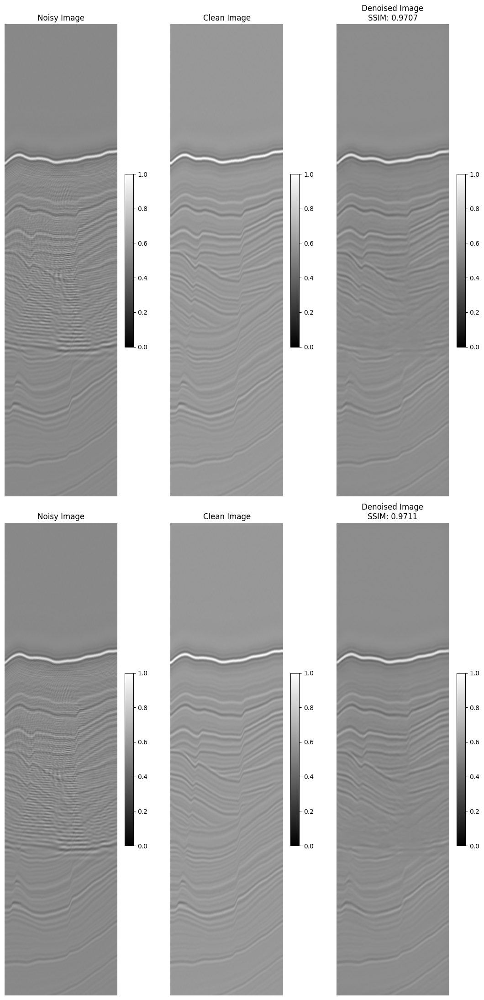

In [10]:
import matplotlib.pyplot as plt
import random

# Visualize Noisy-Clean-Denoised Triplets
fig, axes = plt.subplots(2, 3, figsize=(12, 22))  # Increased height (18 instead of 14)
random_indices = random.sample(range(len(noisy_images)), 2)

for idx, rand_idx in enumerate(random_indices):
    ssim_score = test_ssim_scores[rand_idx]
    vmin, vmax = 0, 1

    # Noisy Image
    im1 = axes[idx, 0].imshow(noisy_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[idx, 0].set_title("Noisy Image", fontsize=12)
    axes[idx, 0].axis('off')
    fig.colorbar(im1, ax=axes[idx, 0], fraction=0.046, pad=0.04)

    # Clean Image
    im2 = axes[idx, 1].imshow(clean_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[idx, 1].set_title("Clean Image", fontsize=12)
    axes[idx, 1].axis('off')
    fig.colorbar(im2, ax=axes[idx, 1], fraction=0.046, pad=0.04)

    # Denoised Image
    im3 = axes[idx, 2].imshow(denoised_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[idx, 2].set_title(f"Denoised Image\nSSIM: {ssim_score:.4f}", fontsize=12)
    axes[idx, 2].axis('off')
    fig.colorbar(im3, ax=axes[idx, 2], fraction=0.046, pad=0.04)

# Make subplots closer
plt.subplots_adjust(hspace=0.25, wspace=0.05)
plt.tight_layout()
plt.show()

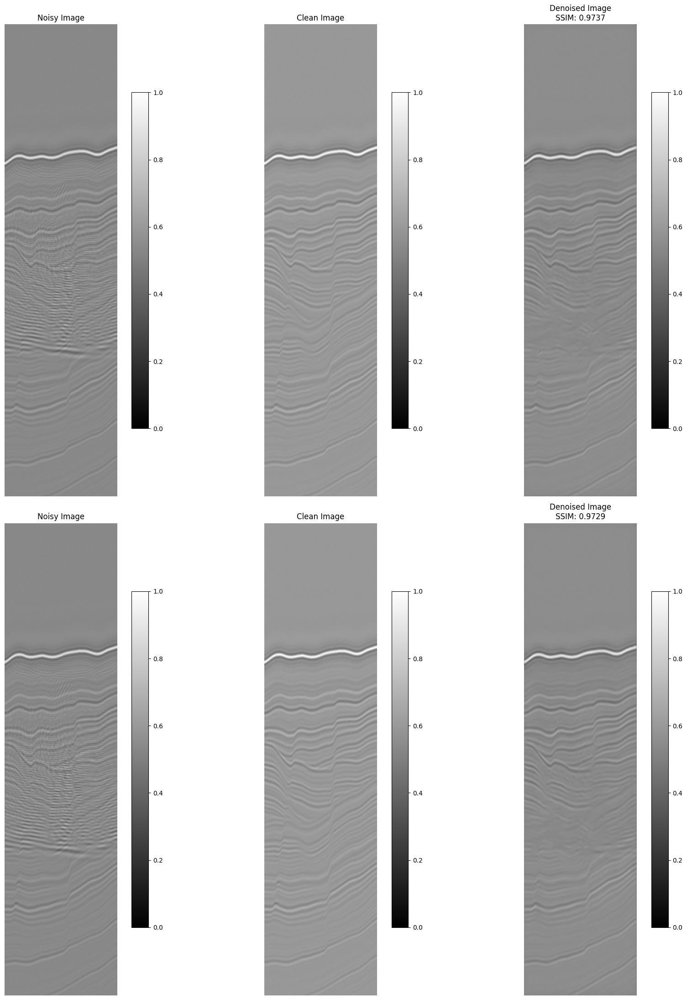

In [21]:
import matplotlib.pyplot as plt
import random

# Visualize Noisy-Clean-Denoised Triplets
fig, axes = plt.subplots(2, 3, figsize=(20, 22))  # Increased height (18 instead of 14)
random_indices = random.sample(range(len(noisy_images)), 2)

for idx, rand_idx in enumerate(random_indices):
    ssim_score = test_ssim_scores[rand_idx]
    vmin, vmax = 0, 1

    # Noisy Image
    im1 = axes[idx, 0].imshow(noisy_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[idx, 0].set_title("Noisy Image", fontsize=12)
    axes[idx, 0].axis('off')
    fig.colorbar(im1, ax=axes[idx, 0], fraction=0.046, pad=0.04)

    # Clean Image
    im2 = axes[idx, 1].imshow(clean_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[idx, 1].set_title("Clean Image", fontsize=12)
    axes[idx, 1].axis('off')
    fig.colorbar(im2, ax=axes[idx, 1], fraction=0.046, pad=0.04)

    # Denoised Image
    im3 = axes[idx, 2].imshow(denoised_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[idx, 2].set_title(f"Denoised Image\nSSIM: {ssim_score:.4f}", fontsize=12)
    axes[idx, 2].axis('off')
    fig.colorbar(im3, ax=axes[idx, 2], fraction=0.046, pad=0.04)

# Make subplots closer
plt.subplots_adjust(hspace=0.25, wspace=0.05)
plt.tight_layout()
plt.show()

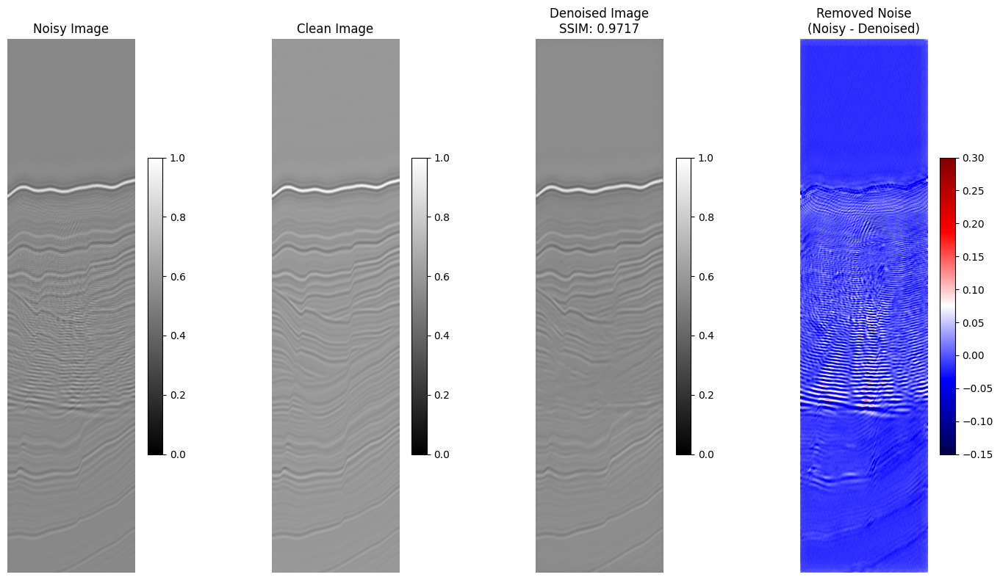

In [15]:
import matplotlib.pyplot as plt
import random

# Choose one random index
rand_idx = random.choice(range(len(noisy_images)))
ssim_score = test_ssim_scores[rand_idx]
vmin, vmax = 0, 1
noise_min, noise_max = -0.15, 0.3  # Adjust depending on dynamic range of noise

# Calculate removed noise
removed_noise = noisy_images[rand_idx] - denoised_images[rand_idx]

# Create 1x4 subplot
fig, axes = plt.subplots(1, 4, figsize=(16, 8))  # Wider figure

# Noisy Image
im0 = axes[0].imshow(noisy_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
axes[0].set_title("Noisy Image", fontsize=12)
axes[0].axis('off')
fig.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

# Clean Image
im1 = axes[1].imshow(clean_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
axes[1].set_title("Clean Image", fontsize=12)
axes[1].axis('off')
fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

# Denoised Image
im2 = axes[2].imshow(denoised_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
axes[2].set_title(f"Denoised Image\nSSIM: {ssim_score:.4f}", fontsize=12)
axes[2].axis('off')
fig.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

# Removed Noise
im3 = axes[3].imshow(removed_noise.squeeze(), cmap='seismic', vmin=noise_min, vmax=noise_max)
axes[3].set_title("Removed Noise\n(Noisy - Denoised)", fontsize=12)
axes[3].axis('off')
fig.colorbar(im3, ax=axes[3], fraction=0.046, pad=0.04)

# Adjust spacing
plt.subplots_adjust(wspace=0.05)
plt.tight_layout()
plt.show()


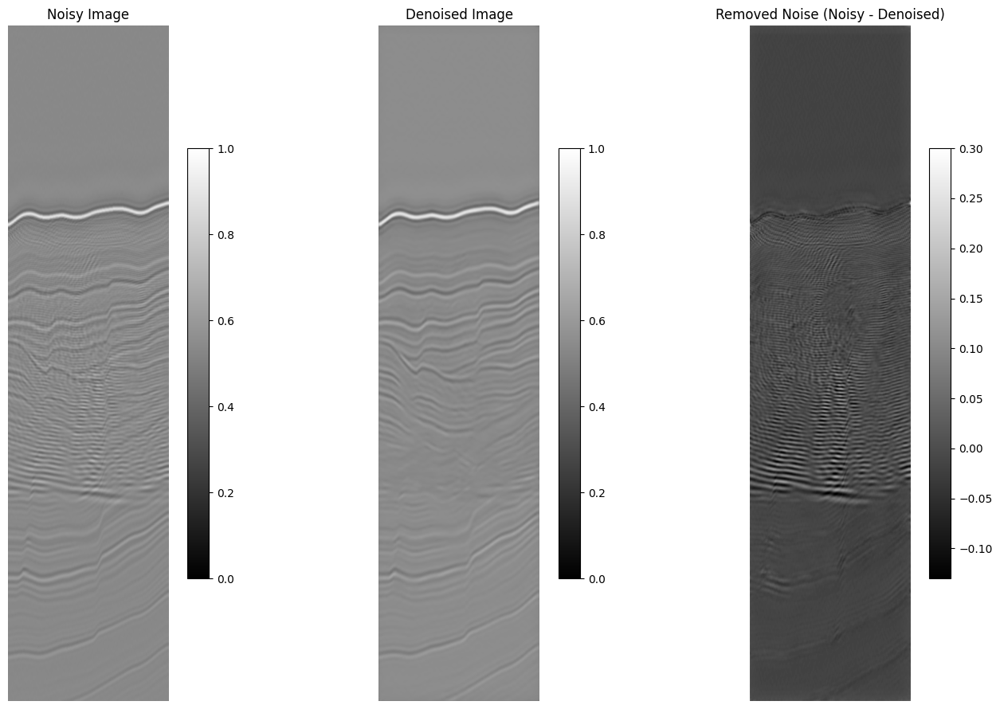

In [23]:
# Select one random index
rand_idx = random.choice(range(len(noisy_images)))

# Compute removed noise = noisy - denoised
removed_noise = noisy_images[rand_idx] - denoised_images[rand_idx]

# Set consistent color scale
vmin, vmax = 0, 1  # Assuming normalized images

# Plot the triplet
fig, axes = plt.subplots(1, 3, figsize=(16, 9))

# Noisy Image
im0 = axes[0].imshow(noisy_images[rand_idx], cmap='gray', vmin=vmin, vmax=vmax)
axes[0].set_title("Noisy Image")
axes[0].axis('off')
fig.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

# Denoised Image
im1 = axes[1].imshow(denoised_images[rand_idx], cmap='gray', vmin=vmin, vmax=vmax)
axes[1].set_title("Denoised Image")
axes[1].axis('off')
fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

# Removed Noise (Difference)
# Optional: you can use a diverging colormap like 'seismic' for better contrast
im2 = axes[2].imshow(removed_noise, cmap='gray', vmin=-0.13, vmax=0.3)
axes[2].set_title("Removed Noise (Noisy - Denoised)")
axes[2].axis('off')
fig.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()


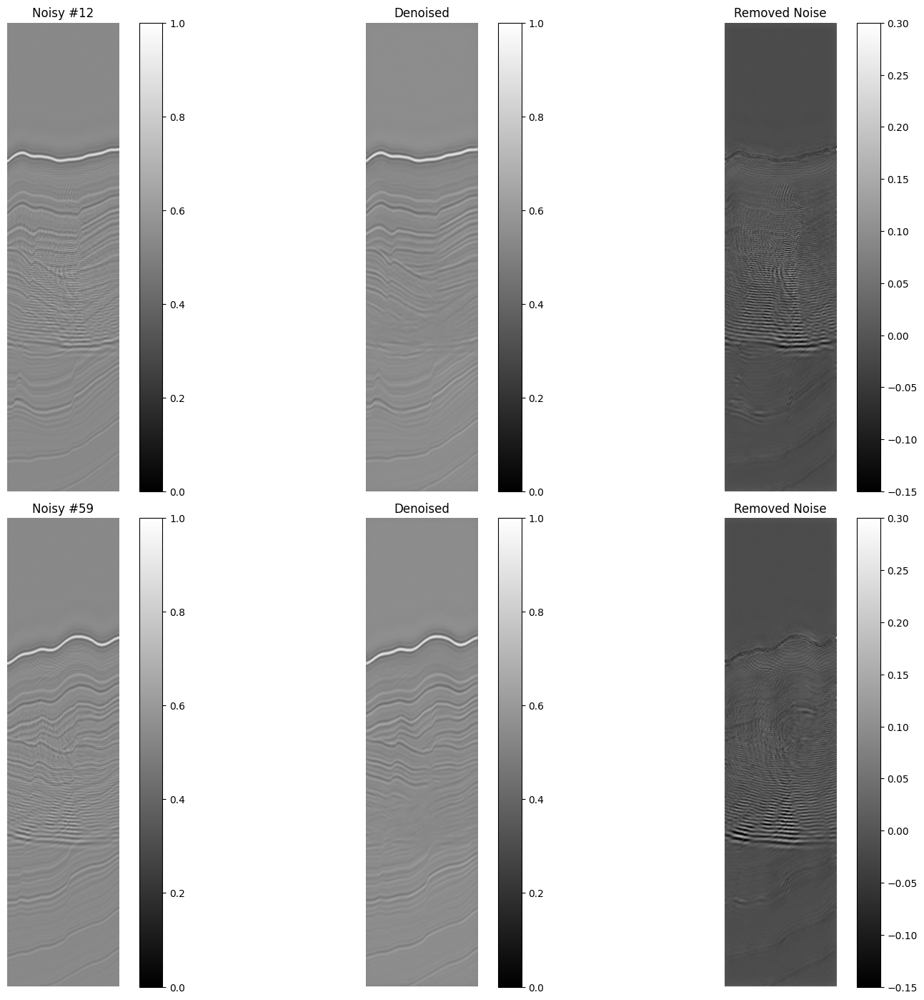

In [ ]:
import matplotlib.pyplot as plt

# Example: Choose your own indices from test dataset
chosen_indices = [12, 59]  # Make sure these indices exist in your image list

fig, axes = plt.subplots(len(chosen_indices), 3, figsize=(18, 7 * len(chosen_indices)))

for idx, img_idx in enumerate(chosen_indices):
    removed_noise = noisy_images[img_idx] - denoised_images[img_idx]

    vmin, vmax = 0, 1
    noise_min, noise_max = -0.15, 0.3

    # Noisy
    im1 = axes[idx, 0].imshow(noisy_images[img_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[idx, 0].set_title(f"Noisy #{img_idx}")
    axes[idx, 0].axis('off')
    fig.colorbar(im1, ax=axes[idx, 0], fraction=0.046, pad=0.04)

    # Denoised
    im2 = axes[idx, 1].imshow(denoised_images[img_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[idx, 1].set_title("Denoised")
    axes[idx, 1].axis('off')
    fig.colorbar(im2, ax=axes[idx, 1], fraction=0.046, pad=0.04)

    # Removed Noise
    im3 = axes[idx, 2].imshow(removed_noise.squeeze(), cmap='gray', vmin=noise_min, vmax=noise_max)
    axes[idx, 2].set_title("Removed Noise")
    axes[idx, 2].axis('off')
    fig.colorbar(im3, ax=axes[idx, 2], fraction=0.046, pad=0.04)


In [ ]:

plt.tight_layout()
plt.show()


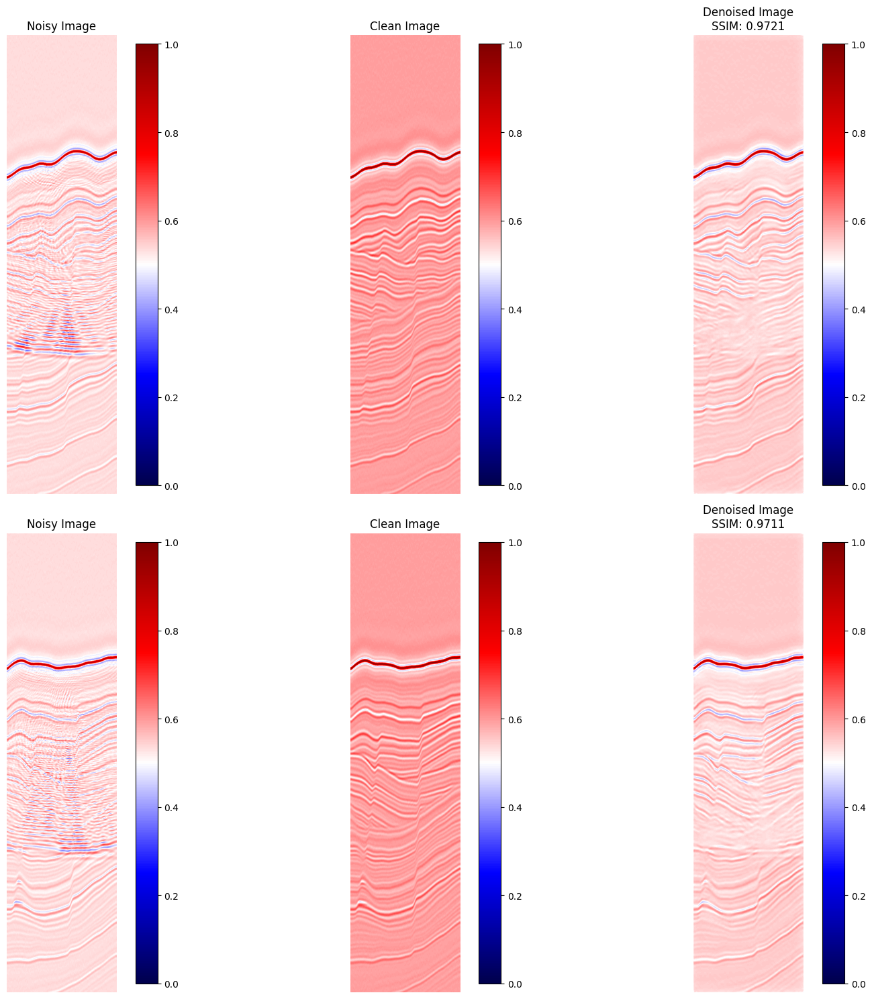

In [26]:
# Visualize Two Random Noisy-Clean-Denoised Image Triplets with Colorbars and SSIM Scores
fig, axes = plt.subplots(2, 3, figsize=(18,15
))
random_indices = random.sample(range(len(noisy_images)), 2)

for idx, rand_idx in enumerate(random_indices):
    # SSIM Score for this pair
    ssim_score = test_ssim_scores[rand_idx]  # Fetch the SSIM score for this image
    vmin,vmax=0,1

    # Noisy Image
    im1 = axes[idx, 0].imshow(noisy_images[rand_idx], cmap='seismic',vmin=vmin, vmax=vmax)
    axes[idx, 0].set_title("Noisy Image")
    axes[idx, 0].axis('off')
    fig.colorbar(im1, ax=axes[idx, 0], fraction=0.046, pad=0.04)  # Colorbar

    # Clean Image
    
    im2 = axes[idx, 1].imshow(clean_images[rand_idx], cmap='seismic', vmin=vmin, vmax=vmax)
    axes[idx, 1].set_title("Clean Image")
    axes[idx, 1].axis('off')
    fig.colorbar(im2, ax=axes[idx, 1], fraction=0.046, pad=0.04)  # Colorbar

    # Denoised Image
    im3 = axes[idx, 2].imshow(denoised_images[rand_idx], cmap='seismic', vmin=vmin, vmax=vmax)
    axes[idx, 2].set_title(f"Denoised Image\nSSIM: {ssim_score:.4f}")  # SSIM displayed in title
    axes[idx, 2].axis('off')
    fig.colorbar(im3, ax=axes[idx, 2], fraction=0.046, pad=0.04)  # Colorbar

plt.tight_layout()
plt.show()
